In [1]:
import stan
import pandas as pd
import numpy as np
import math
import matplotlib.pyplot as plt
from scipy.stats import gaussian_kde
from scipy.optimize import minimize
import nest_asyncio
nest_asyncio.apply()

In [2]:
def preprocess_data(data):
    """Preprocess data for RLWM model fitting"""
    df_clean = data[(data['choice'] != -1) &
                    (data['key'] != -1) &
                    (data['cor'] != -1) &
                    (data['rew'] != -1) &
                    (data['rt'] > 0.15)]  # Match MATLAB rt threshold
    return df_clean

In [3]:
wm_model = """
data {
  int<lower=1> N;                   // Number of trials
  int<lower=1> S;                   // Number of stimuli
  int<lower=1> A;                   // Number of actions
  array[N] int<lower=1, upper=S> stimuli;  // Stimulus on each trial
  array[N] int<lower=1, upper=A> actions;  // Action chosen on each trial
  array[N] int<lower=0, upper=1> rewards;  // Reward received on each trial
  array[N] int<lower=1> set_sizes;  // Set size for the current block
}

parameters {
  real<lower=0, upper=1> epsilon;   // Forgetting/decay parameter
  real<lower=1, upper=10> capacity; // WM capacity parameter
  real<lower=0, upper=1> w0;        // Initial WM weight
  real<lower=0> beta_wm;            // WM inverse temperature
}

model {
  // Priors
  epsilon ~ normal(0.1, 0.1);
  capacity ~ normal(4, 1);
  w0 ~ normal(0.95, 1);
  beta_wm ~ normal(12, 3);

  // Initialize WM values
  array[S] vector[A] Q_wm;
  for (s in 1:S) {
    Q_wm[s] = rep_vector(0.0, A);
  }

  for (t in 1:N) {
    int s = stimuli[t];
    int a = actions[t];

    // Apply decay to WM values (toward uniform)
    for (act in 1:A) {
      Q_wm[s, act] = Q_wm[s, act] + epsilon * ((1.0 / A) - Q_wm[s, act]);
    }

    // Calculate capacity-limited probability
    real p_in_wm = fmin(1.0, capacity / set_sizes[t]);

    // Compute effective WM contribution
    real effective_w = w0 * p_in_wm;

    // Compute choice probabilities
    vector[A] choice_probs;
    vector[A] wm_probs = softmax(beta_wm * Q_wm[s]);

    for (j in 1:A) {
      choice_probs[j] = effective_w * wm_probs[j] + (1 - effective_w) * (1.0 / A);
    }

    // Action selection
    actions[t] ~ categorical(choice_probs);

    // Update WM based on reward
    if (rewards[t] == 1) {
      for (act in 1:A) {
        if (act == a) {
          Q_wm[s, act] = 1.0;
        } else {
          Q_wm[s, act] = 0.0;
        }
      }
    }
  }
}
"""

In [4]:
import arviz as az
import matplotlib.pyplot as plt
import pandas as pd

def plot_mcmc_convergence(fit_object, var_names=['epsilon', 'capacity', 'w0', 'beta_wm'], subject_id=None, block_id=None):
    """
    Generates MCMC trace plots matching the example image style for Working Memory model parameters.

    Args:
        fit_object: The fit object returned by compiled_model.sample().
        var_names (list, optional): List of parameter names to plot/summarize.
                                    Defaults to ['epsilon', 'capacity', 'w0', 'beta_wm'].
        subject_id (optional): Identifier for the subject for plot titles.
        block_id (optional): Identifier for the block for plot titles.
    """
    if fit_object is None:
        print("Cannot plot convergence: fit_object is None.")
        return

    # Convert to InferenceData if not already
    if not isinstance(fit_object, az.InferenceData):
        try:
            fit_object = az.convert_to_inference_data(fit_object)
        except Exception as e:
            print(f"Error converting to InferenceData: {e}")
            return

    # Create figure with subplots - one for each parameter
    n_params = len(var_names)
    fig, axes = plt.subplots(1, n_params, figsize=(4*n_params, 4), sharey=False)

    # Handle single parameter case
    if n_params == 1:
        axes = [axes]

    # Define chain colors matching the example image
    chain_colors = ['#FF7F0E', '#9467BD', '#4C2889', '#DBAF57']  # orange, purple, dark purple, light brown

    # Plot each parameter
    for i, var_name in enumerate(var_names):
        if var_name not in fit_object.posterior:
            print(f"Warning: Parameter '{var_name}' not found in fit object.")
            axes[i].text(0.5, 0.5, f"Parameter '{var_name}' not found",
                        ha='center', transform=axes[i].transAxes)
            continue

        # Get parameter data
        param_data = fit_object.posterior[var_name]

        # Handle multidimensional parameters if needed
        if len(param_data.dims) > 2:
            # For multidimensional params, just plot the first element
            if 'chain' in param_data.dims and 'draw' in param_data.dims:
                flat_dims = [d for d in param_data.dims if d not in ['chain', 'draw']]
                if flat_dims:
                    idx = {dim: 0 for dim in flat_dims}
                    param_data = param_data.isel(**idx)
            else:
                print(f"Warning: Parameter '{var_name}' doesn't have expected dimensions.")
                continue

        # Plot each chain
        for c in range(min(len(param_data.chain), 4)):
            chain_data = param_data.sel(chain=c)
            axes[i].plot(chain_data, color=chain_colors[c], linewidth=0.7, alpha=0.9)

        # Set title and labels
        axes[i].set_title(var_name)
        axes[i].set_xlabel("Iteration")

    # Add legend for chain colors
    handles = [plt.Line2D([0], [0], color=color, linewidth=1)
              for color in chain_colors[:min(len(fit_object.posterior.chain), 4)]]
    labels = [str(i+1) for i in range(min(len(fit_object.posterior.chain), 4))]

    # Place legend with "chain" title like in example
    fig.legend(handles, labels, title="chain",
              loc='upper right', bbox_to_anchor=(0.99, 0.99))

    # Set title if subject/block provided
    if subject_id is not None or block_id is not None:
        title = "MCMC Convergence"
        if subject_id is not None:
            title += f" for Subject {subject_id}"
        if block_id is not None:
            if subject_id is not None:
                title += f", Block {block_id}"
            else:
                title += f" for Block {block_id}"
        plt.suptitle(title)

    plt.tight_layout()
    plt.show()

    # Calculate and print summary statistics
    try:
        print("\nCalculating Summary Statistics (including R-hat, ESS)...")
        summary_stats = az.summary(fit_object, var_names=var_names)
        print("Summary Statistics:")
        with pd.option_context('display.max_rows', None,
                             'display.max_columns', None,
                             'display.width', 1000):
            print(summary_stats)
    except Exception as e:
        print(f"Error generating summary statistics: {e}")


In [11]:
import numpy as np
import pandas as pd
from scipy.optimize import minimize
from scipy.stats import gaussian_kde
import math

def fit_wm_model(df, num_chains=4, num_samples=200):
    results = []
    subject_block_groups = df.groupby(['subno', 'block'])
    # j=1

    for (subject, block), group_data in subject_block_groups:
        # j+=1
        # if(j==19):
        #   break
        print(f"Processing Subject: {subject}, Block: {block}...")

        # Extract set_sizes for the current block
        # Assuming set_size column exists in the dataframe
        set_sizes = group_data['ns'].values.astype(int)

        stan_data = {
            'N': len(group_data),
            'S': int(group_data['ns'].max()),
            'A': 3,
            'stimuli': group_data['stimseq'].values.astype(int),
            'actions': group_data['choice'].values.astype(int),
            'rewards': group_data['rew'].values.astype(int),
            'set_sizes': set_sizes  # Added set_sizes parameter for WM model
        }

        wm_sm = stan.build(wm_model, data=stan_data)  # Using wm_model instead of rl2_model
        wm_fit = wm_sm.sample(
            num_chains=num_chains,
            num_samples=num_samples
        )

        plot_mcmc_convergence(
            fit_object=wm_fit,
            var_names=['epsilon', 'capacity', 'w0', 'beta_wm'],  # WM model parameters
            subject_id=subject,
            block_id=block
        )

        # Extract all 4 WM model parameters
        epsilon_mle = np.ravel(wm_fit['epsilon'])
        capacity_mle = np.ravel(wm_fit['capacity'])
        w0_mle = np.ravel(wm_fit['w0'])
        beta_wm_mle = np.ravel(wm_fit['beta_wm'])
        n_samples = len(epsilon_mle)

        print(f"Number of samples: {n_samples}")

        samples_df = pd.DataFrame({
            'subno': [subject] * n_samples,
            'block': [block] * n_samples,
            'epsilon': epsilon_mle,
            'capacity': capacity_mle,
            'w0': w0_mle,
            'beta_wm': beta_wm_mle
        })

        # Prepare samples for KDE
        epsilon = samples_df['epsilon']
        capacity = samples_df['capacity']
        w0 = samples_df['w0']
        beta_wm = samples_df['beta_wm']
        samples = np.vstack([epsilon, capacity, w0, beta_wm])

        print("Performing Kernel Density Estimation...")
        kde = gaussian_kde(samples)
        print("KDE calculation finished.")

        # Set parameter bounds based on the WM model constraints
        param_bounds = [
            (0.01, 0.99),    # epsilon: 0-1 (centered around 0.1)
            (1.0, 10.0),     # capacity: 1-10 (centered around 5.4)
            (0.5, 1.0),      # w0: 0.5-1 (centered around 0.95)
            (1.0, 30.0)      # beta_wm: 1-30 (centered around 12)
        ]

        def neg_kde(params):
            epsilon, capacity, w0, beta_wm = params
            # Check if parameters are within bounds
            if not (param_bounds[0][0] <= epsilon <= param_bounds[0][1] and
                    param_bounds[1][0] <= capacity <= param_bounds[1][1] and
                    param_bounds[2][0] <= w0 <= param_bounds[2][1] and
                    param_bounds[3][0] <= beta_wm <= param_bounds[3][1]):
                return np.inf
            try:
                density = kde(params)[0]
                return -density if (math.isfinite(density) and density > 0) else np.inf
            except Exception:
                return np.inf

        store = []

        for i in range(100):
            initial_guess = [
                np.random.uniform(param_bounds[0][0], param_bounds[0][1]),  # epsilon
                np.random.uniform(param_bounds[1][0], param_bounds[1][1]),  # capacity
                np.random.uniform(param_bounds[2][0], param_bounds[2][1]),  # w0
                np.random.uniform(param_bounds[3][0], param_bounds[3][1])   # beta_wm
            ]

            print(f"Run {i+1}: Starting optimization from initial guess: epsilon={initial_guess[0]:.4f}, "
                  f"capacity={initial_guess[1]:.4f}, w0={initial_guess[2]:.4f}, beta_wm={initial_guess[3]:.4f}")

            result = minimize(
                fun=neg_kde,
                x0=initial_guess,
                method='L-BFGS-B',
                bounds=param_bounds,
                options={'ftol': 1e-5, 'gtol': 1e-5, 'disp': False}
            )

            if result.success:
                mle_estimate = result.x
                final_density = kde(mle_estimate)[0]
                store.append([mle_estimate[0], mle_estimate[1], mle_estimate[2], mle_estimate[3], final_density])
                print(f"  epsilon: {mle_estimate[0]:.6f}, capacity: {mle_estimate[1]:.6f}, "
                      f"w0: {mle_estimate[2]:.6f}, beta_wm: {mle_estimate[3]:.6f}, KDE density: {final_density:.4g}")
            else:
                print(f"  Optimization failed to converge. Message: {result.message}")

        store_results = pd.DataFrame(store, columns=['epsilon', 'capacity', 'w0', 'beta_wm', 'density'])
        rounded_density = store_results['density'].round(1)
        final_df = store_results[rounded_density == rounded_density.max()]

        print(f"Final epsilon: {final_df['epsilon'].mean():.4f}, Final capacity: {final_df['capacity'].mean():.4f}, "
              f"Final w0: {final_df['w0'].mean():.4f}, Final beta_wm: {final_df['beta_wm'].mean():.4f}")

        results.append([subject, block,
                        final_df['epsilon'].mean(),
                        final_df['capacity'].mean(),
                        final_df['w0'].mean(),
                        final_df['beta_wm'].mean()])

    df_results = pd.DataFrame(results, columns=['subno', 'block', 'epsilon', 'capacity', 'w0', 'beta_wm'])
    return df_results


In [12]:
data = pd.read_csv('./expe_data.csv')
df_clean = preprocess_data(data)

Processing Subject: 1, Block: 1...
Building...



Building: found in cache, done.Messages from stanc:
Warning in '/tmp/httpstan_dy0nag4s/model_d7qc4gjt.stan', line 24, column 19: Argument
    12 suggests there may be parameters that are not unit scale; consider
    rescaling with a multiplier (see manual section 22.12).
    bound in its declaration. These hard constraints are not recommended, for
    two reasons: (a) Except when there are logical or physical constraints,
    it is very unusual for you to be sure that a parameter will fall inside a
    specified range, and (b) The infinite gradient induced by a hard
    constraint can cause difficulties for Stan's sampling algorithm. As a
    consequence, we recommend soft constraints rather than hard constraints;
    for example, instead of constraining an elasticity parameter to fall
    between 0, and 1, leave it unconstrained and give it a normal(0.5,0.5)
    prior distribution.
Sampling:   0%
Sampling:  25% (3000/12000)
Sampling:  50% (6000/12000)
Sampling:  75% (9000/12000)
Samp

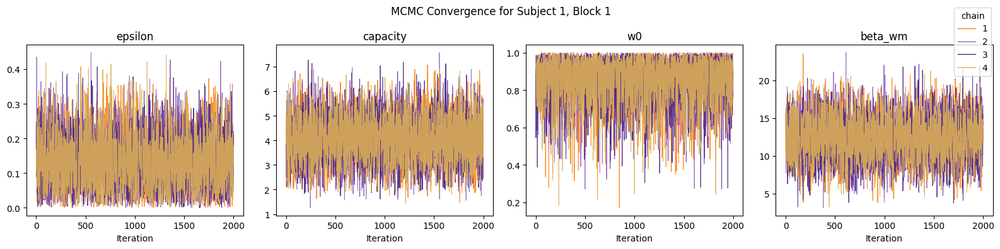


Calculating Summary Statistics (including R-hat, ESS)...
Summary Statistics:
            mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  r_hat
epsilon    0.127  0.079   0.000    0.261      0.001    0.001    4539.0    2523.0    1.0
capacity   4.024  0.963   2.116    5.690      0.011    0.011    7092.0    4275.0    1.0
w0         0.867  0.120   0.648    1.000      0.001    0.002    5834.0    3747.0    1.0
beta_wm   12.114  2.941   6.390   17.355      0.037    0.034    6075.0    3540.0    1.0
Number of samples: 8000
Performing Kernel Density Estimation...
KDE calculation finished.
Run 1: Starting optimization from initial guess: epsilon=0.3363, capacity=8.3027, w0=0.6993, beta_wm=27.2708
  epsilon: 0.336290, capacity: 8.302697, w0: 0.699343, beta_wm: 27.270784, KDE density: 7.713e-43
Run 2: Starting optimization from initial guess: epsilon=0.1672, capacity=2.3881, w0=0.9019, beta_wm=16.2684
  epsilon: 0.113838, capacity: 4.000027, w0: 0.948786, beta_wm: 12.508212, K


Building: found in cache, done.Messages from stanc:
Warning in '/tmp/httpstan_dy0nag4s/model_d7qc4gjt.stan', line 24, column 19: Argument
    12 suggests there may be parameters that are not unit scale; consider
    rescaling with a multiplier (see manual section 22.12).
    bound in its declaration. These hard constraints are not recommended, for
    two reasons: (a) Except when there are logical or physical constraints,
    it is very unusual for you to be sure that a parameter will fall inside a
    specified range, and (b) The infinite gradient induced by a hard
    constraint can cause difficulties for Stan's sampling algorithm. As a
    consequence, we recommend soft constraints rather than hard constraints;
    for example, instead of constraining an elasticity parameter to fall
    between 0, and 1, leave it unconstrained and give it a normal(0.5,0.5)
    prior distribution.
Sampling:   0%
Sampling:   5% (600/12000)
Sampling:  30% (3600/12000)
Sampling:  55% (6600/12000)
Sampl

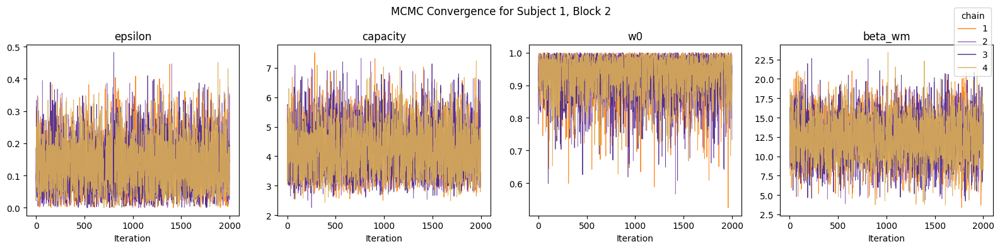


Calculating Summary Statistics (including R-hat, ESS)...
Summary Statistics:
            mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  r_hat
epsilon    0.127  0.079   0.000    0.262      0.001    0.001    4403.0    2344.0    1.0
capacity   4.232  0.830   2.807    5.705      0.011    0.009    6168.0    5498.0    1.0
w0         0.938  0.059   0.829    1.000      0.001    0.001    5437.0    3406.0    1.0
beta_wm   12.037  2.891   6.524   17.448      0.039    0.035    5428.0    3301.0    1.0
Number of samples: 8000
Performing Kernel Density Estimation...
KDE calculation finished.
Run 1: Starting optimization from initial guess: epsilon=0.0264, capacity=1.8411, w0=0.5787, beta_wm=23.7349
  epsilon: 0.026447, capacity: 1.841130, w0: 0.578719, beta_wm: 23.734852, KDE density: 7.036e-23
Run 2: Starting optimization from initial guess: epsilon=0.5399, capacity=7.1334, w0=0.5219, beta_wm=22.2713
  epsilon: 0.539909, capacity: 7.133351, w0: 0.521908, beta_wm: 22.271294, K


Building: found in cache, done.Messages from stanc:
Warning in '/tmp/httpstan_dy0nag4s/model_d7qc4gjt.stan', line 24, column 19: Argument
    12 suggests there may be parameters that are not unit scale; consider
    rescaling with a multiplier (see manual section 22.12).
    bound in its declaration. These hard constraints are not recommended, for
    two reasons: (a) Except when there are logical or physical constraints,
    it is very unusual for you to be sure that a parameter will fall inside a
    specified range, and (b) The infinite gradient induced by a hard
    constraint can cause difficulties for Stan's sampling algorithm. As a
    consequence, we recommend soft constraints rather than hard constraints;
    for example, instead of constraining an elasticity parameter to fall
    between 0, and 1, leave it unconstrained and give it a normal(0.5,0.5)
    prior distribution.
Sampling:   0%
Sampling:  25% (3000/12000)
Sampling:  50% (6000/12000)
Sampling:  75% (9000/12000)
Samp

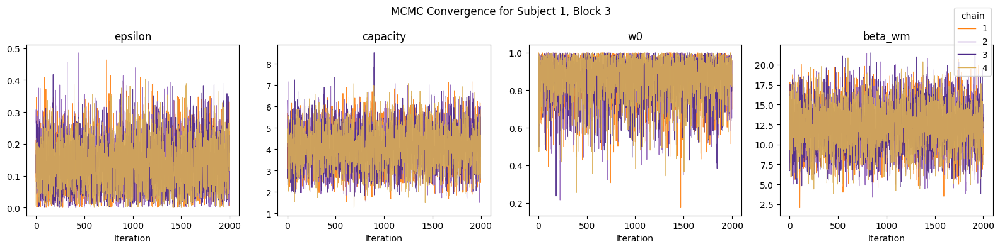


Calculating Summary Statistics (including R-hat, ESS)...
Summary Statistics:
            mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  r_hat
epsilon    0.129  0.079   0.000    0.263      0.001    0.001    4809.0    2459.0    1.0
capacity   4.030  0.952   2.310    5.853      0.011    0.011    6943.0    4718.0    1.0
w0         0.877  0.112   0.663    1.000      0.001    0.002    5815.0    3193.0    1.0
beta_wm   12.069  2.879   6.811   17.585      0.036    0.032    6235.0    4277.0    1.0
Number of samples: 8000
Performing Kernel Density Estimation...
KDE calculation finished.
Run 1: Starting optimization from initial guess: epsilon=0.0485, capacity=9.0523, w0=0.5027, beta_wm=5.0552
  epsilon: 0.048455, capacity: 9.052301, w0: 0.502743, beta_wm: 5.055178, KDE density: 1.885e-29
Run 2: Starting optimization from initial guess: epsilon=0.8881, capacity=1.0236, w0=0.9167, beta_wm=2.5655
  epsilon: 0.888050, capacity: 1.023637, w0: 0.916730, beta_wm: 2.565498, KDE d


Building: found in cache, done.Messages from stanc:
Warning in '/tmp/httpstan_dy0nag4s/model_d7qc4gjt.stan', line 24, column 19: Argument
    12 suggests there may be parameters that are not unit scale; consider
    rescaling with a multiplier (see manual section 22.12).
    bound in its declaration. These hard constraints are not recommended, for
    two reasons: (a) Except when there are logical or physical constraints,
    it is very unusual for you to be sure that a parameter will fall inside a
    specified range, and (b) The infinite gradient induced by a hard
    constraint can cause difficulties for Stan's sampling algorithm. As a
    consequence, we recommend soft constraints rather than hard constraints;
    for example, instead of constraining an elasticity parameter to fall
    between 0, and 1, leave it unconstrained and give it a normal(0.5,0.5)
    prior distribution.
Sampling:   0%
Sampling:   1% (100/12000)
Sampling:   2% (300/12000)
Sampling:   5% (600/12000)
Samplin

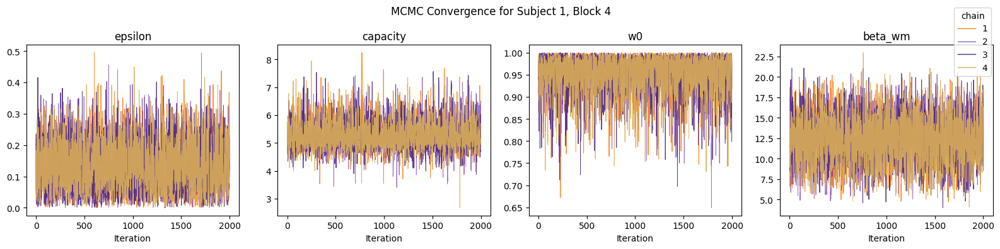


Calculating Summary Statistics (including R-hat, ESS)...
Summary Statistics:
            mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  r_hat
epsilon    0.128  0.079   0.000    0.261      0.001    0.001    4369.0    2415.0    1.0
capacity   5.298  0.534   4.443    6.452      0.008    0.011    4904.0    3438.0    1.0
w0         0.957  0.041   0.883    1.000      0.000    0.001    4968.0    3200.0    1.0
beta_wm   12.112  2.887   6.663   17.557      0.039    0.031    5241.0    3907.0    1.0
Number of samples: 8000
Performing Kernel Density Estimation...
KDE calculation finished.
Run 1: Starting optimization from initial guess: epsilon=0.4037, capacity=7.5836, w0=0.8184, beta_wm=24.4147
  epsilon: 0.403690, capacity: 7.583635, w0: 0.818398, beta_wm: 24.414683, KDE density: 5.595e-38
Run 2: Starting optimization from initial guess: epsilon=0.5583, capacity=4.5654, w0=0.5099, beta_wm=24.5827
  epsilon: 0.558311, capacity: 4.565410, w0: 0.509929, beta_wm: 24.582653, K

/home/sachida/miniconda3/envs/stanenv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:596: RuntimeWarning: invalid value encountered in subtract
  df = fun(x1) - f0


  epsilon: 0.021049, capacity: 5.200585, w0: 0.983092, beta_wm: 13.695925, KDE density: 3.757
Run 13: Starting optimization from initial guess: epsilon=0.3277, capacity=2.4431, w0=0.6818, beta_wm=24.3099
  epsilon: 0.327667, capacity: 2.443085, w0: 0.681810, beta_wm: 24.309929, KDE density: 1.65e-73
Run 14: Starting optimization from initial guess: epsilon=0.5253, capacity=6.3117, w0=0.8224, beta_wm=23.1329
  epsilon: 0.525307, capacity: 6.311716, w0: 0.822364, beta_wm: 23.132937, KDE density: 6.067e-38
Run 15: Starting optimization from initial guess: epsilon=0.4713, capacity=6.5953, w0=0.6371, beta_wm=26.5868
  epsilon: 0.471297, capacity: 6.595294, w0: 0.637064, beta_wm: 26.586831, KDE density: 1.499e-72
Run 16: Starting optimization from initial guess: epsilon=0.4727, capacity=8.4093, w0=0.9974, beta_wm=17.3369
  epsilon: 0.472691, capacity: 8.409296, w0: 0.997419, beta_wm: 17.336882, KDE density: 3.513e-26
Run 17: Starting optimization from initial guess: epsilon=0.8473, capacity=


Building: found in cache, done.Messages from stanc:
Warning in '/tmp/httpstan_dy0nag4s/model_d7qc4gjt.stan', line 24, column 19: Argument
    12 suggests there may be parameters that are not unit scale; consider
    rescaling with a multiplier (see manual section 22.12).
    bound in its declaration. These hard constraints are not recommended, for
    two reasons: (a) Except when there are logical or physical constraints,
    it is very unusual for you to be sure that a parameter will fall inside a
    specified range, and (b) The infinite gradient induced by a hard
    constraint can cause difficulties for Stan's sampling algorithm. As a
    consequence, we recommend soft constraints rather than hard constraints;
    for example, instead of constraining an elasticity parameter to fall
    between 0, and 1, leave it unconstrained and give it a normal(0.5,0.5)
    prior distribution.
Sampling:   0%
Sampling:   0% (1/12000)
Sampling:   1% (101/12000)
Sampling:   2% (201/12000)
Sampling:

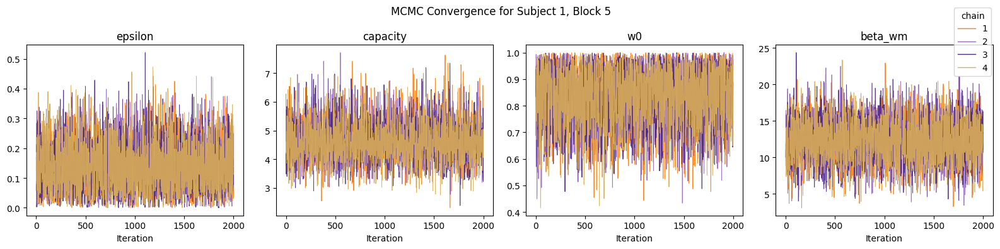


Calculating Summary Statistics (including R-hat, ESS)...
Summary Statistics:
            mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  r_hat
epsilon    0.130  0.082   0.000    0.270      0.001    0.001    3694.0    2290.0    1.0
capacity   4.646  0.681   3.341    5.916      0.011    0.010    3612.0    3830.0    1.0
w0         0.842  0.106   0.659    1.000      0.002    0.001    3124.0    2804.0    1.0
beta_wm   12.052  2.905   6.592   17.420      0.042    0.035    4615.0    3621.0    1.0
Number of samples: 8000
Performing Kernel Density Estimation...
KDE calculation finished.
Run 1: Starting optimization from initial guess: epsilon=0.6493, capacity=8.7419, w0=0.8166, beta_wm=5.6831
  epsilon: 0.649286, capacity: 8.741867, w0: 0.816638, beta_wm: 5.683053, KDE density: 5.805e-83
Run 2: Starting optimization from initial guess: epsilon=0.4970, capacity=1.9623, w0=0.8760, beta_wm=1.9777
  epsilon: 0.496973, capacity: 1.962316, w0: 0.876030, beta_wm: 1.977656, KDE d


Building: found in cache, done.Messages from stanc:
Warning in '/tmp/httpstan_dy0nag4s/model_d7qc4gjt.stan', line 24, column 19: Argument
    12 suggests there may be parameters that are not unit scale; consider
    rescaling with a multiplier (see manual section 22.12).
    bound in its declaration. These hard constraints are not recommended, for
    two reasons: (a) Except when there are logical or physical constraints,
    it is very unusual for you to be sure that a parameter will fall inside a
    specified range, and (b) The infinite gradient induced by a hard
    constraint can cause difficulties for Stan's sampling algorithm. As a
    consequence, we recommend soft constraints rather than hard constraints;
    for example, instead of constraining an elasticity parameter to fall
    between 0, and 1, leave it unconstrained and give it a normal(0.5,0.5)
    prior distribution.
Sampling:   0%
Sampling:   3% (400/12000)
Sampling:   7% (800/12000)
Sampling:  12% (1400/12000)
Sampli

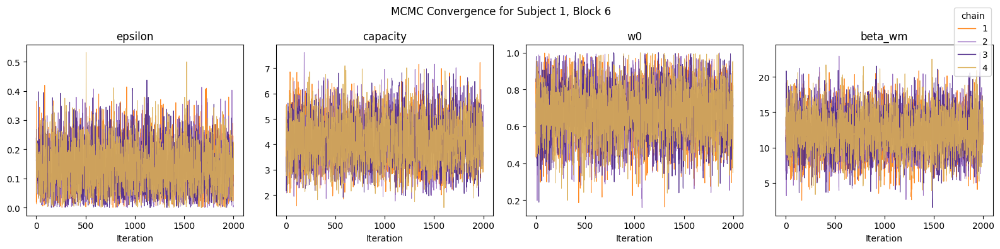


Calculating Summary Statistics (including R-hat, ESS)...
Summary Statistics:
            mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  r_hat
epsilon    0.128  0.079   0.000    0.261      0.001    0.001    4155.0    2571.0    1.0
capacity   4.085  0.910   2.506    5.841      0.013    0.010    4523.0    4643.0    1.0
w0         0.685  0.143   0.434    0.970      0.002    0.002    4551.0    2648.0    1.0
beta_wm   12.003  3.001   6.514   17.802      0.041    0.038    5360.0    3491.0    1.0
Number of samples: 8000
Performing Kernel Density Estimation...
KDE calculation finished.
Run 1: Starting optimization from initial guess: epsilon=0.6698, capacity=7.8556, w0=0.9979, beta_wm=1.0900
  epsilon: 0.669786, capacity: 7.855592, w0: 0.997922, beta_wm: 1.090021, KDE density: 5.574e-64
Run 2: Starting optimization from initial guess: epsilon=0.6638, capacity=5.0584, w0=0.9803, beta_wm=3.0158
  epsilon: 0.663850, capacity: 5.058428, w0: 0.980265, beta_wm: 3.015793, KDE d


Building: found in cache, done.Messages from stanc:
Warning in '/tmp/httpstan_dy0nag4s/model_d7qc4gjt.stan', line 24, column 19: Argument
    12 suggests there may be parameters that are not unit scale; consider
    rescaling with a multiplier (see manual section 22.12).
    bound in its declaration. These hard constraints are not recommended, for
    two reasons: (a) Except when there are logical or physical constraints,
    it is very unusual for you to be sure that a parameter will fall inside a
    specified range, and (b) The infinite gradient induced by a hard
    constraint can cause difficulties for Stan's sampling algorithm. As a
    consequence, we recommend soft constraints rather than hard constraints;
    for example, instead of constraining an elasticity parameter to fall
    between 0, and 1, leave it unconstrained and give it a normal(0.5,0.5)
    prior distribution.
Sampling:   0%
Sampling:   5% (600/12000)
Sampling:  30% (3600/12000)
Sampling:  55% (6600/12000)
Sampl

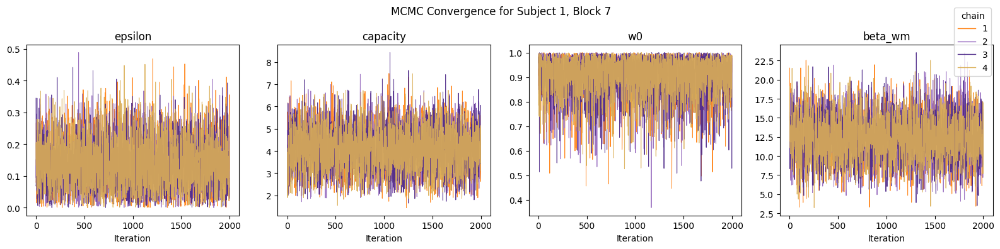


Calculating Summary Statistics (including R-hat, ESS)...
Summary Statistics:
            mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  r_hat
epsilon    0.129  0.080   0.000    0.267      0.001    0.001    4966.0    2991.0    1.0
capacity   4.051  0.972   2.249    5.839      0.012    0.011    6561.0    4521.0    1.0
w0         0.912  0.081   0.764    1.000      0.001    0.001    5449.0    3009.0    1.0
beta_wm   12.141  2.911   6.671   17.637      0.037    0.036    6123.0    3850.0    1.0
Number of samples: 8000
Performing Kernel Density Estimation...
KDE calculation finished.
Run 1: Starting optimization from initial guess: epsilon=0.7905, capacity=9.3078, w0=0.9198, beta_wm=7.9049
  epsilon: 0.790479, capacity: 9.307755, w0: 0.919779, beta_wm: 7.904894, KDE density: 1.838e-74
Run 2: Starting optimization from initial guess: epsilon=0.1094, capacity=4.7115, w0=0.7887, beta_wm=14.0934
  epsilon: 0.092349, capacity: 3.962172, w0: 0.965191, beta_wm: 11.270616, KDE


Building: found in cache, done.Messages from stanc:
Warning in '/tmp/httpstan_dy0nag4s/model_d7qc4gjt.stan', line 24, column 19: Argument
    12 suggests there may be parameters that are not unit scale; consider
    rescaling with a multiplier (see manual section 22.12).
    bound in its declaration. These hard constraints are not recommended, for
    two reasons: (a) Except when there are logical or physical constraints,
    it is very unusual for you to be sure that a parameter will fall inside a
    specified range, and (b) The infinite gradient induced by a hard
    constraint can cause difficulties for Stan's sampling algorithm. As a
    consequence, we recommend soft constraints rather than hard constraints;
    for example, instead of constraining an elasticity parameter to fall
    between 0, and 1, leave it unconstrained and give it a normal(0.5,0.5)
    prior distribution.
Sampling:   0%
Sampling:   2% (300/12000)
Sampling:   7% (800/12000)
Sampling:  12% (1500/12000)
Sampli

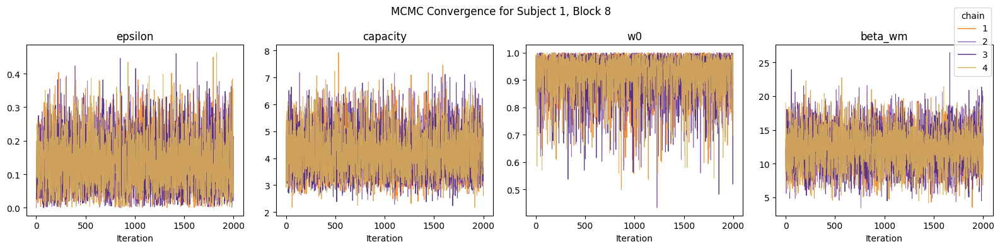


Calculating Summary Statistics (including R-hat, ESS)...
Summary Statistics:
            mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  r_hat
epsilon    0.127  0.080   0.000    0.264      0.001    0.001    3996.0    2618.0    1.0
capacity   4.233  0.849   2.817    5.819      0.011    0.009    6758.0    5347.0    1.0
w0         0.925  0.071   0.796    1.000      0.001    0.001    5947.0    3619.0    1.0
beta_wm   12.114  2.913   6.756   17.657      0.034    0.031    7252.0    4942.0    1.0
Number of samples: 8000
Performing Kernel Density Estimation...
KDE calculation finished.
Run 1: Starting optimization from initial guess: epsilon=0.7778, capacity=8.9947, w0=0.6201, beta_wm=7.5184
  epsilon: 0.777799, capacity: 8.994696, w0: 0.620062, beta_wm: 7.518410, KDE density: 5.823e-106
Run 2: Starting optimization from initial guess: epsilon=0.7312, capacity=9.5516, w0=0.8174, beta_wm=8.5787
  epsilon: 0.731157, capacity: 9.551596, w0: 0.817385, beta_wm: 8.578690, KDE 


Building: found in cache, done.Messages from stanc:
Warning in '/tmp/httpstan_dy0nag4s/model_d7qc4gjt.stan', line 24, column 19: Argument
    12 suggests there may be parameters that are not unit scale; consider
    rescaling with a multiplier (see manual section 22.12).
    bound in its declaration. These hard constraints are not recommended, for
    two reasons: (a) Except when there are logical or physical constraints,
    it is very unusual for you to be sure that a parameter will fall inside a
    specified range, and (b) The infinite gradient induced by a hard
    constraint can cause difficulties for Stan's sampling algorithm. As a
    consequence, we recommend soft constraints rather than hard constraints;
    for example, instead of constraining an elasticity parameter to fall
    between 0, and 1, leave it unconstrained and give it a normal(0.5,0.5)
    prior distribution.
Sampling:   0%
Sampling:   0% (1/12000)
Sampling:   1% (101/12000)
Sampling:   2% (201/12000)
Sampling:

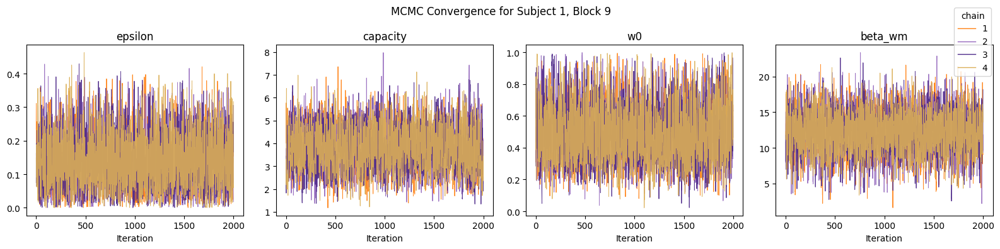


Calculating Summary Statistics (including R-hat, ESS)...
Summary Statistics:
            mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  r_hat
epsilon    0.132  0.081   0.000    0.271      0.001    0.001    4295.0    2804.0    1.0
capacity   3.750  0.947   2.009    5.484      0.015    0.010    3771.0    3639.0    1.0
w0         0.499  0.184   0.164    0.854      0.003    0.002    3767.0    2542.0    1.0
beta_wm   11.942  2.998   6.445   17.877      0.041    0.039    5396.0    3566.0    1.0
Number of samples: 8000
Performing Kernel Density Estimation...
KDE calculation finished.
Run 1: Starting optimization from initial guess: epsilon=0.1031, capacity=3.8026, w0=0.5888, beta_wm=27.9068
  epsilon: 0.103112, capacity: 3.802623, w0: 0.588817, beta_wm: 27.906841, KDE density: 3.933e-14
Run 2: Starting optimization from initial guess: epsilon=0.0453, capacity=7.9699, w0=0.9974, beta_wm=11.3087
  epsilon: 0.045302, capacity: 7.969919, w0: 0.997409, beta_wm: 11.308678, K


Building: found in cache, done.Messages from stanc:
Warning in '/tmp/httpstan_dy0nag4s/model_d7qc4gjt.stan', line 24, column 19: Argument
    12 suggests there may be parameters that are not unit scale; consider
    rescaling with a multiplier (see manual section 22.12).
    bound in its declaration. These hard constraints are not recommended, for
    two reasons: (a) Except when there are logical or physical constraints,
    it is very unusual for you to be sure that a parameter will fall inside a
    specified range, and (b) The infinite gradient induced by a hard
    constraint can cause difficulties for Stan's sampling algorithm. As a
    consequence, we recommend soft constraints rather than hard constraints;
    for example, instead of constraining an elasticity parameter to fall
    between 0, and 1, leave it unconstrained and give it a normal(0.5,0.5)
    prior distribution.
Sampling:   0%
Sampling:   0% (1/12000)
Sampling:   0% (2/12000)
Sampling:   1% (102/12000)
Sampling:  

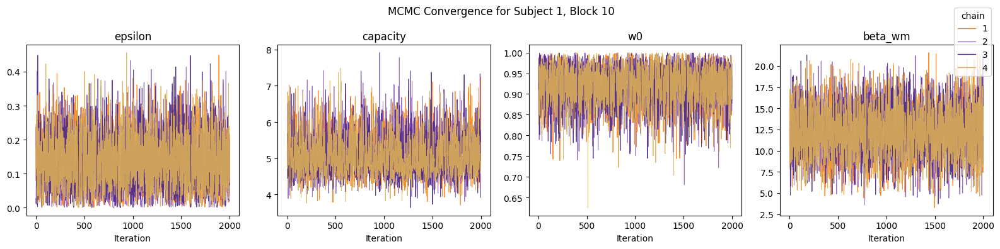


Calculating Summary Statistics (including R-hat, ESS)...
Summary Statistics:
            mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  r_hat
epsilon    0.126  0.078   0.000    0.259      0.001    0.001    3186.0    1915.0    1.0
capacity   5.111  0.551   4.176    6.200      0.010    0.009    2798.0    3495.0    1.0
w0         0.927  0.046   0.849    1.000      0.001    0.001    2881.0    1325.0    1.0
beta_wm   12.087  2.906   6.734   17.665      0.042    0.033    4820.0    3628.0    1.0
Number of samples: 8000
Performing Kernel Density Estimation...
KDE calculation finished.
Run 1: Starting optimization from initial guess: epsilon=0.0382, capacity=7.2876, w0=0.7475, beta_wm=1.6314
  epsilon: 0.038231, capacity: 7.287628, w0: 0.747502, beta_wm: 1.631360, KDE density: 2.618e-15
Run 2: Starting optimization from initial guess: epsilon=0.6949, capacity=9.7406, w0=0.5830, beta_wm=17.7025
  epsilon: 0.694865, capacity: 9.740646, w0: 0.583021, beta_wm: 17.702509, KDE


Building: found in cache, done.Messages from stanc:
Warning in '/tmp/httpstan_dy0nag4s/model_d7qc4gjt.stan', line 24, column 19: Argument
    12 suggests there may be parameters that are not unit scale; consider
    rescaling with a multiplier (see manual section 22.12).
    bound in its declaration. These hard constraints are not recommended, for
    two reasons: (a) Except when there are logical or physical constraints,
    it is very unusual for you to be sure that a parameter will fall inside a
    specified range, and (b) The infinite gradient induced by a hard
    constraint can cause difficulties for Stan's sampling algorithm. As a
    consequence, we recommend soft constraints rather than hard constraints;
    for example, instead of constraining an elasticity parameter to fall
    between 0, and 1, leave it unconstrained and give it a normal(0.5,0.5)
    prior distribution.
Sampling:   0%
Sampling:   2% (200/12000)
Sampling:   4% (500/12000)
Sampling:   7% (800/12000)
Samplin

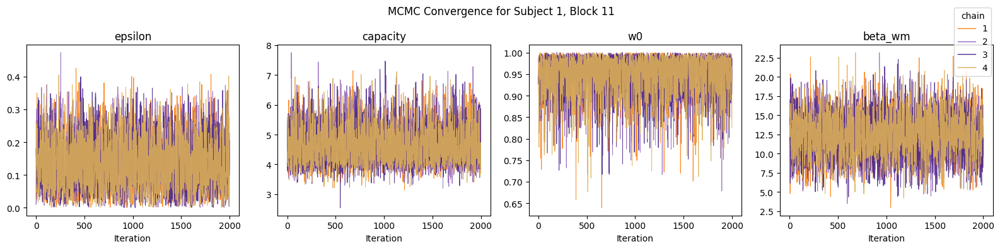


Calculating Summary Statistics (including R-hat, ESS)...
Summary Statistics:
            mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  r_hat
epsilon    0.127  0.078   0.000    0.261      0.001    0.001    3977.0    2206.0    1.0
capacity   4.680  0.659   3.624    5.954      0.010    0.009    5079.0    3551.0    1.0
w0         0.953  0.045   0.870    1.000      0.001    0.001    4537.0    2522.0    1.0
beta_wm   12.139  2.876   6.873   17.545      0.041    0.035    4726.0    3619.0    1.0
Number of samples: 8000
Performing Kernel Density Estimation...
KDE calculation finished.
Run 1: Starting optimization from initial guess: epsilon=0.2790, capacity=8.7616, w0=0.9526, beta_wm=7.7519
  epsilon: 0.279017, capacity: 8.761563, w0: 0.952582, beta_wm: 7.751937, KDE density: 1.527e-07
Run 2: Starting optimization from initial guess: epsilon=0.5714, capacity=4.4352, w0=0.7844, beta_wm=5.8281
  epsilon: 0.571429, capacity: 4.435247, w0: 0.784403, beta_wm: 5.828142, KDE d

/home/sachida/miniconda3/envs/stanenv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:596: RuntimeWarning: invalid value encountered in subtract
  df = fun(x1) - f0


  epsilon: 0.083210, capacity: 4.338614, w0: 0.979708, beta_wm: 12.043970, KDE density: 4.867
Run 44: Starting optimization from initial guess: epsilon=0.9489, capacity=8.8271, w0=0.5508, beta_wm=22.1770
  epsilon: 0.948859, capacity: 8.827052, w0: 0.550823, beta_wm: 22.177012, KDE density: 8.187e-270
Run 45: Starting optimization from initial guess: epsilon=0.3056, capacity=4.7300, w0=0.8700, beta_wm=8.4760
  epsilon: 0.083248, capacity: 4.338765, w0: 0.979711, beta_wm: 12.042094, KDE density: 4.867
Run 46: Starting optimization from initial guess: epsilon=0.3146, capacity=4.9052, w0=0.7161, beta_wm=20.8543
  epsilon: 0.314639, capacity: 4.905185, w0: 0.716102, beta_wm: 20.854285, KDE density: 8.718e-15
Run 47: Starting optimization from initial guess: epsilon=0.8537, capacity=1.7202, w0=0.9105, beta_wm=6.9859
  epsilon: 0.853680, capacity: 1.720236, w0: 0.910461, beta_wm: 6.985921, KDE density: 1.983e-99
Run 48: Starting optimization from initial guess: epsilon=0.6347, capacity=6.539


Building: found in cache, done.Messages from stanc:
Warning in '/tmp/httpstan_dy0nag4s/model_d7qc4gjt.stan', line 24, column 19: Argument
    12 suggests there may be parameters that are not unit scale; consider
    rescaling with a multiplier (see manual section 22.12).
    bound in its declaration. These hard constraints are not recommended, for
    two reasons: (a) Except when there are logical or physical constraints,
    it is very unusual for you to be sure that a parameter will fall inside a
    specified range, and (b) The infinite gradient induced by a hard
    constraint can cause difficulties for Stan's sampling algorithm. As a
    consequence, we recommend soft constraints rather than hard constraints;
    for example, instead of constraining an elasticity parameter to fall
    between 0, and 1, leave it unconstrained and give it a normal(0.5,0.5)
    prior distribution.
Sampling:   0%
Sampling:   3% (400/12000)
Sampling:  28% (3400/12000)
Sampling:  53% (6400/12000)
Sampl

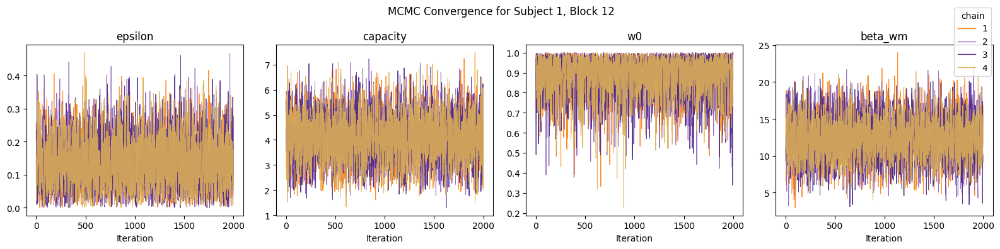


Calculating Summary Statistics (including R-hat, ESS)...
Summary Statistics:
            mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  r_hat
epsilon    0.129  0.079   0.000    0.264      0.001    0.001    5173.0    2790.0    1.0
capacity   4.027  0.956   2.197    5.752      0.011    0.011    7035.0    4642.0    1.0
w0         0.894  0.096   0.714    1.000      0.001    0.001    5644.0    3418.0    1.0
beta_wm   12.081  2.959   6.612   17.776      0.036    0.033    6730.0    4068.0    1.0
Number of samples: 8000
Performing Kernel Density Estimation...
KDE calculation finished.
Run 1: Starting optimization from initial guess: epsilon=0.4964, capacity=4.6539, w0=0.5689, beta_wm=20.3847
  epsilon: 0.496418, capacity: 4.653857, w0: 0.568924, beta_wm: 20.384737, KDE density: 3.668e-20
Run 2: Starting optimization from initial guess: epsilon=0.2418, capacity=1.3490, w0=0.9515, beta_wm=17.7526
  epsilon: 0.111932, capacity: 4.080271, w0: 0.964560, beta_wm: 12.100949, K


Building: found in cache, done.Messages from stanc:
Warning in '/tmp/httpstan_dy0nag4s/model_d7qc4gjt.stan', line 24, column 19: Argument
    12 suggests there may be parameters that are not unit scale; consider
    rescaling with a multiplier (see manual section 22.12).
    bound in its declaration. These hard constraints are not recommended, for
    two reasons: (a) Except when there are logical or physical constraints,
    it is very unusual for you to be sure that a parameter will fall inside a
    specified range, and (b) The infinite gradient induced by a hard
    constraint can cause difficulties for Stan's sampling algorithm. As a
    consequence, we recommend soft constraints rather than hard constraints;
    for example, instead of constraining an elasticity parameter to fall
    between 0, and 1, leave it unconstrained and give it a normal(0.5,0.5)
    prior distribution.
Sampling:   0%
Sampling:   3% (400/12000)
Sampling:   8% (1000/12000)
Sampling:  15% (1800/12000)
Sampl

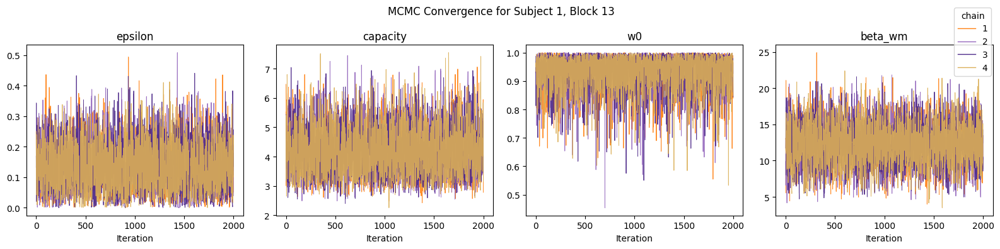


Calculating Summary Statistics (including R-hat, ESS)...
Summary Statistics:
            mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  r_hat
epsilon    0.127  0.080   0.000    0.265      0.001    0.001    4156.0    2017.0    1.0
capacity   4.220  0.821   2.836    5.721      0.010    0.009    6501.0    5079.0    1.0
w0         0.936  0.062   0.823    1.000      0.001    0.001    5826.0    3667.0    1.0
beta_wm   12.109  2.895   6.773   17.586      0.035    0.032    6746.0    4479.0    1.0
Number of samples: 8000
Performing Kernel Density Estimation...
KDE calculation finished.
Run 1: Starting optimization from initial guess: epsilon=0.7951, capacity=7.8329, w0=0.7452, beta_wm=15.9965
  epsilon: 0.795149, capacity: 7.832911, w0: 0.745191, beta_wm: 15.996468, KDE density: 3.449e-89
Run 2: Starting optimization from initial guess: epsilon=0.1422, capacity=3.5300, w0=0.6831, beta_wm=14.6046
  epsilon: 0.084058, capacity: 4.092154, w0: 0.663150, beta_wm: 14.610244, K


Building: found in cache, done.Messages from stanc:
Warning in '/tmp/httpstan_dy0nag4s/model_d7qc4gjt.stan', line 24, column 19: Argument
    12 suggests there may be parameters that are not unit scale; consider
    rescaling with a multiplier (see manual section 22.12).
    bound in its declaration. These hard constraints are not recommended, for
    two reasons: (a) Except when there are logical or physical constraints,
    it is very unusual for you to be sure that a parameter will fall inside a
    specified range, and (b) The infinite gradient induced by a hard
    constraint can cause difficulties for Stan's sampling algorithm. As a
    consequence, we recommend soft constraints rather than hard constraints;
    for example, instead of constraining an elasticity parameter to fall
    between 0, and 1, leave it unconstrained and give it a normal(0.5,0.5)
    prior distribution.
Sampling:   0%
Sampling:   3% (400/12000)
Sampling:  28% (3400/12000)
Sampling:  53% (6400/12000)
Sampl

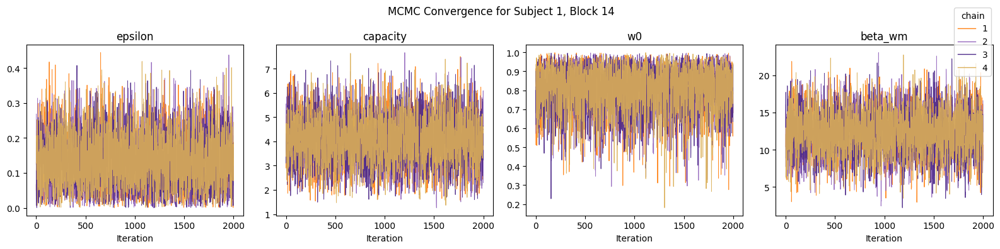


Calculating Summary Statistics (including R-hat, ESS)...
Summary Statistics:
            mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  r_hat
epsilon    0.128  0.078   0.001    0.261      0.001    0.001    5536.0    2993.0    1.0
capacity   4.016  0.998   2.140    5.876      0.012    0.013    6371.0    3728.0    1.0
w0         0.816  0.118   0.601    0.994      0.001    0.002    6993.0    4461.0    1.0
beta_wm   12.060  2.961   6.502   17.664      0.039    0.035    5795.0    4133.0    1.0
Number of samples: 8000
Performing Kernel Density Estimation...
KDE calculation finished.
Run 1: Starting optimization from initial guess: epsilon=0.0314, capacity=8.9311, w0=0.6391, beta_wm=11.0361
  epsilon: 0.031362, capacity: 8.931093, w0: 0.639108, beta_wm: 11.036143, KDE density: 4.416e-12
Run 2: Starting optimization from initial guess: epsilon=0.3621, capacity=9.4901, w0=0.6828, beta_wm=6.1779
  epsilon: 0.362143, capacity: 9.490088, w0: 0.682788, beta_wm: 6.177859, KDE


Building: found in cache, done.Messages from stanc:
Warning in '/tmp/httpstan_dy0nag4s/model_d7qc4gjt.stan', line 24, column 19: Argument
    12 suggests there may be parameters that are not unit scale; consider
    rescaling with a multiplier (see manual section 22.12).
    bound in its declaration. These hard constraints are not recommended, for
    two reasons: (a) Except when there are logical or physical constraints,
    it is very unusual for you to be sure that a parameter will fall inside a
    specified range, and (b) The infinite gradient induced by a hard
    constraint can cause difficulties for Stan's sampling algorithm. As a
    consequence, we recommend soft constraints rather than hard constraints;
    for example, instead of constraining an elasticity parameter to fall
    between 0, and 1, leave it unconstrained and give it a normal(0.5,0.5)
    prior distribution.
Sampling:   0%
Sampling:   1% (100/12000)
Sampling:   2% (300/12000)
Sampling:   4% (500/12000)
Samplin

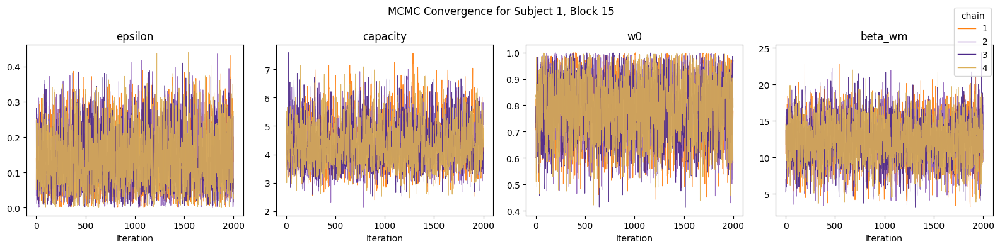


Calculating Summary Statistics (including R-hat, ESS)...
Summary Statistics:
            mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  r_hat
epsilon    0.129  0.082   0.000    0.272      0.001    0.001    3212.0    2023.0    1.0
capacity   4.357  0.767   3.042    5.851      0.014    0.011    3002.0    3959.0    1.0
w0         0.796  0.117   0.607    0.999      0.002    0.001    2990.0    2001.0    1.0
beta_wm   11.992  2.991   6.315   17.623      0.045    0.037    4375.0    3017.0    1.0
Number of samples: 8000
Performing Kernel Density Estimation...
KDE calculation finished.
Run 1: Starting optimization from initial guess: epsilon=0.9519, capacity=6.1888, w0=0.6325, beta_wm=13.3291
  epsilon: 0.951949, capacity: 6.188820, w0: 0.632459, beta_wm: 13.329118, KDE density: 1.822e-87
Run 2: Starting optimization from initial guess: epsilon=0.8317, capacity=2.5268, w0=0.7551, beta_wm=23.6721
  epsilon: 0.831690, capacity: 2.526831, w0: 0.755141, beta_wm: 23.672111, K


Building: found in cache, done.Messages from stanc:
Warning in '/tmp/httpstan_dy0nag4s/model_d7qc4gjt.stan', line 24, column 19: Argument
    12 suggests there may be parameters that are not unit scale; consider
    rescaling with a multiplier (see manual section 22.12).
    bound in its declaration. These hard constraints are not recommended, for
    two reasons: (a) Except when there are logical or physical constraints,
    it is very unusual for you to be sure that a parameter will fall inside a
    specified range, and (b) The infinite gradient induced by a hard
    constraint can cause difficulties for Stan's sampling algorithm. As a
    consequence, we recommend soft constraints rather than hard constraints;
    for example, instead of constraining an elasticity parameter to fall
    between 0, and 1, leave it unconstrained and give it a normal(0.5,0.5)
    prior distribution.
Sampling:   0%
Sampling:   1% (100/12000)
Sampling:   2% (300/12000)
Sampling:   5% (600/12000)
Samplin

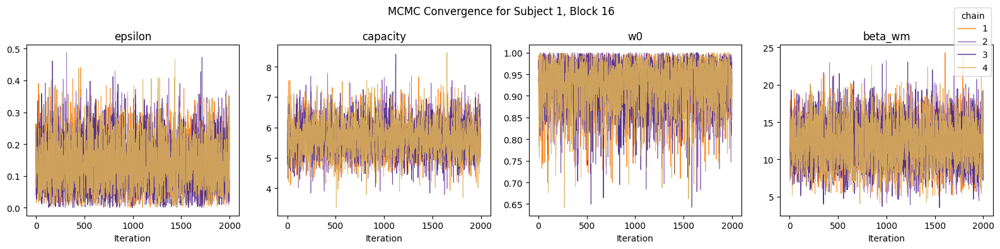


Calculating Summary Statistics (including R-hat, ESS)...
Summary Statistics:
            mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  r_hat
epsilon    0.128  0.079   0.001    0.263      0.001    0.001    4542.0    2775.0    1.0
capacity   5.667  0.544   4.667    6.739      0.008    0.008    5110.0    4359.0    1.0
w0         0.931  0.054   0.837    1.000      0.001    0.001    3759.0    2367.0    1.0
beta_wm   12.119  2.937   6.827   17.825      0.036    0.033    6343.0    4100.0    1.0
Number of samples: 8000
Performing Kernel Density Estimation...
KDE calculation finished.
Run 1: Starting optimization from initial guess: epsilon=0.1021, capacity=1.1116, w0=0.7018, beta_wm=6.4468
  epsilon: 0.102061, capacity: 1.111550, w0: 0.701814, beta_wm: 6.446791, KDE density: 3.462e-56
Run 2: Starting optimization from initial guess: epsilon=0.6839, capacity=7.3269, w0=0.7206, beta_wm=26.4344
  epsilon: 0.683906, capacity: 7.326888, w0: 0.720565, beta_wm: 26.434448, KDE


Building: found in cache, done.Messages from stanc:
Warning in '/tmp/httpstan_dy0nag4s/model_d7qc4gjt.stan', line 24, column 19: Argument
    12 suggests there may be parameters that are not unit scale; consider
    rescaling with a multiplier (see manual section 22.12).
    bound in its declaration. These hard constraints are not recommended, for
    two reasons: (a) Except when there are logical or physical constraints,
    it is very unusual for you to be sure that a parameter will fall inside a
    specified range, and (b) The infinite gradient induced by a hard
    constraint can cause difficulties for Stan's sampling algorithm. As a
    consequence, we recommend soft constraints rather than hard constraints;
    for example, instead of constraining an elasticity parameter to fall
    between 0, and 1, leave it unconstrained and give it a normal(0.5,0.5)
    prior distribution.
Sampling:   0%
Sampling:   2% (200/12000)
Sampling:   6% (700/12000)
Sampling:  12% (1400/12000)
Sampli

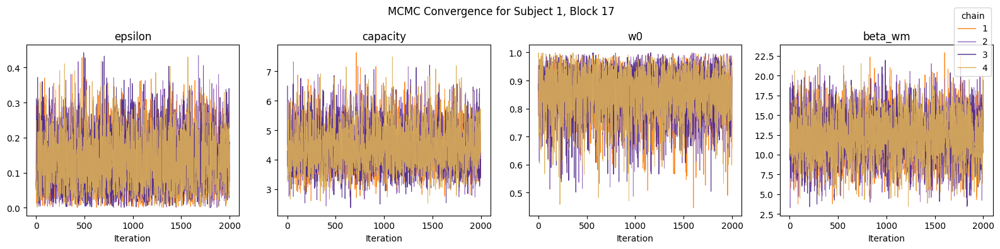


Calculating Summary Statistics (including R-hat, ESS)...
Summary Statistics:
            mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  r_hat
epsilon    0.128  0.079   0.001    0.262      0.001    0.001    3880.0    2433.0    1.0
capacity   4.413  0.750   3.114    5.823      0.010    0.009    5081.0    5098.0    1.0
w0         0.861  0.085   0.712    0.999      0.001    0.001    4422.0    2147.0    1.0
beta_wm   12.022  2.964   6.355   17.439      0.039    0.035    5672.0    3877.0    1.0
Number of samples: 8000
Performing Kernel Density Estimation...
KDE calculation finished.
Run 1: Starting optimization from initial guess: epsilon=0.0541, capacity=6.4093, w0=0.8514, beta_wm=28.2162
  epsilon: 0.054078, capacity: 6.409306, w0: 0.851420, beta_wm: 28.216240, KDE density: 2.07e-17
Run 2: Starting optimization from initial guess: epsilon=0.6666, capacity=6.5038, w0=0.7179, beta_wm=9.3811
  epsilon: 0.666626, capacity: 6.503811, w0: 0.717882, beta_wm: 9.381145, KDE 


Building: found in cache, done.Messages from stanc:
Warning in '/tmp/httpstan_dy0nag4s/model_d7qc4gjt.stan', line 24, column 19: Argument
    12 suggests there may be parameters that are not unit scale; consider
    rescaling with a multiplier (see manual section 22.12).
    bound in its declaration. These hard constraints are not recommended, for
    two reasons: (a) Except when there are logical or physical constraints,
    it is very unusual for you to be sure that a parameter will fall inside a
    specified range, and (b) The infinite gradient induced by a hard
    constraint can cause difficulties for Stan's sampling algorithm. As a
    consequence, we recommend soft constraints rather than hard constraints;
    for example, instead of constraining an elasticity parameter to fall
    between 0, and 1, leave it unconstrained and give it a normal(0.5,0.5)
    prior distribution.
Sampling:   0%
Sampling:   7% (800/12000)
Sampling:  32% (3800/12000)
Sampling:  57% (6800/12000)
Sampl

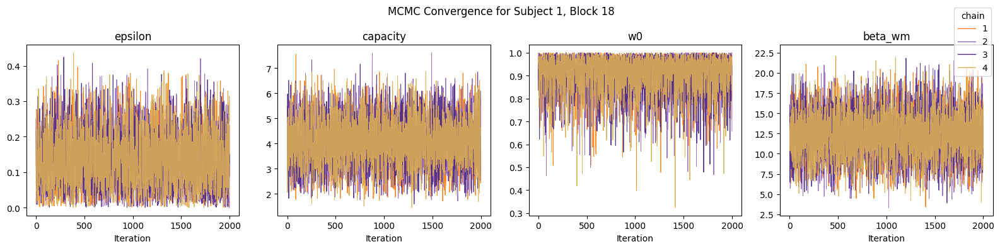


Calculating Summary Statistics (including R-hat, ESS)...
Summary Statistics:
            mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  r_hat
epsilon    0.128  0.079   0.000    0.264      0.001    0.001    4199.0    2419.0    1.0
capacity   4.034  0.961   2.230    5.779      0.011    0.010    7240.0    4747.0    1.0
w0         0.916  0.080   0.771    1.000      0.001    0.001    6516.0    3673.0    1.0
beta_wm   12.116  2.906   6.841   17.752      0.034    0.034    7107.0    3940.0    1.0
Number of samples: 8000
Performing Kernel Density Estimation...
KDE calculation finished.
Run 1: Starting optimization from initial guess: epsilon=0.1875, capacity=9.5821, w0=0.7446, beta_wm=4.3339
  epsilon: 0.187495, capacity: 9.582088, w0: 0.744624, beta_wm: 4.333866, KDE density: 5.926e-32
Run 2: Starting optimization from initial guess: epsilon=0.3835, capacity=1.0728, w0=0.7649, beta_wm=27.8918
  epsilon: 0.383512, capacity: 1.072802, w0: 0.764896, beta_wm: 27.891772, KDE


Building: found in cache, done.Messages from stanc:
Warning in '/tmp/httpstan_dy0nag4s/model_d7qc4gjt.stan', line 24, column 19: Argument
    12 suggests there may be parameters that are not unit scale; consider
    rescaling with a multiplier (see manual section 22.12).
    bound in its declaration. These hard constraints are not recommended, for
    two reasons: (a) Except when there are logical or physical constraints,
    it is very unusual for you to be sure that a parameter will fall inside a
    specified range, and (b) The infinite gradient induced by a hard
    constraint can cause difficulties for Stan's sampling algorithm. As a
    consequence, we recommend soft constraints rather than hard constraints;
    for example, instead of constraining an elasticity parameter to fall
    between 0, and 1, leave it unconstrained and give it a normal(0.5,0.5)
    prior distribution.
Sampling:   0%
Sampling:   3% (400/12000)
Sampling:  10% (1200/12000)
Sampling:  35% (4200/12000)
Sampl

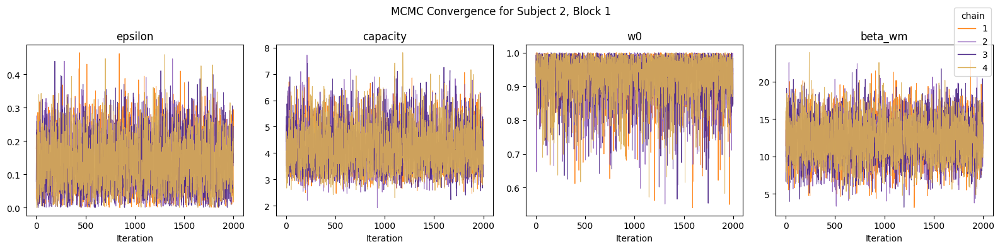


Calculating Summary Statistics (including R-hat, ESS)...
Summary Statistics:
            mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  r_hat
epsilon    0.126  0.080   0.000    0.264      0.001    0.001    4019.0    2122.0    1.0
capacity   4.224  0.834   2.839    5.773      0.011    0.009    5969.0    5273.0    1.0
w0         0.935  0.063   0.819    1.000      0.001    0.001    6726.0    3729.0    1.0
beta_wm   12.135  2.863   6.872   17.426      0.037    0.032    5948.0    4140.0    1.0
Number of samples: 8000
Performing Kernel Density Estimation...
KDE calculation finished.
Run 1: Starting optimization from initial guess: epsilon=0.4000, capacity=5.4886, w0=0.9719, beta_wm=1.6091
  epsilon: 0.400007, capacity: 5.488604, w0: 0.971892, beta_wm: 1.609105, KDE density: 1.856e-11
Run 2: Starting optimization from initial guess: epsilon=0.6728, capacity=9.0060, w0=0.5060, beta_wm=1.1521
  epsilon: 0.672816, capacity: 9.006007, w0: 0.506024, beta_wm: 1.152136, KDE d


Building: found in cache, done.Messages from stanc:
Warning in '/tmp/httpstan_dy0nag4s/model_d7qc4gjt.stan', line 24, column 19: Argument
    12 suggests there may be parameters that are not unit scale; consider
    rescaling with a multiplier (see manual section 22.12).
    bound in its declaration. These hard constraints are not recommended, for
    two reasons: (a) Except when there are logical or physical constraints,
    it is very unusual for you to be sure that a parameter will fall inside a
    specified range, and (b) The infinite gradient induced by a hard
    constraint can cause difficulties for Stan's sampling algorithm. As a
    consequence, we recommend soft constraints rather than hard constraints;
    for example, instead of constraining an elasticity parameter to fall
    between 0, and 1, leave it unconstrained and give it a normal(0.5,0.5)
    prior distribution.
Sampling:   0%
Sampling:   2% (200/12000)
Sampling:   4% (500/12000)
Sampling:   8% (900/12000)
Samplin

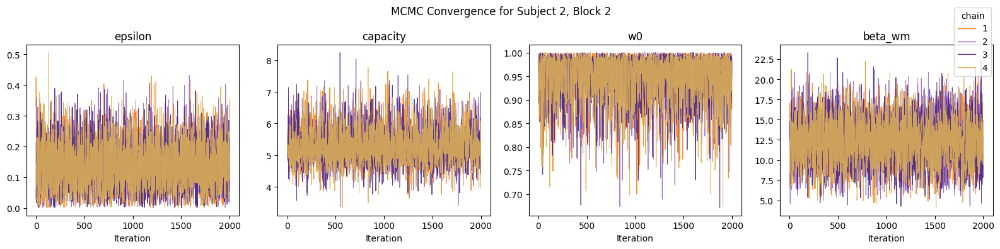


Calculating Summary Statistics (including R-hat, ESS)...
Summary Statistics:
            mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  r_hat
epsilon    0.128  0.078   0.000    0.260      0.001    0.001    4388.0    2522.0    1.0
capacity   5.289  0.545   4.371    6.430      0.007    0.008    6699.0    4376.0    1.0
w0         0.954  0.045   0.871    1.000      0.001    0.001    4269.0    2465.0    1.0
beta_wm   12.169  2.841   6.714   17.402      0.036    0.031    5952.0    4548.0    1.0
Number of samples: 8000
Performing Kernel Density Estimation...
KDE calculation finished.
Run 1: Starting optimization from initial guess: epsilon=0.2279, capacity=3.8417, w0=0.7666, beta_wm=20.4617
  epsilon: 0.227905, capacity: 3.841691, w0: 0.766602, beta_wm: 20.461690, KDE density: 2.715e-08
Run 2: Starting optimization from initial guess: epsilon=0.2031, capacity=4.6600, w0=0.8759, beta_wm=28.0943
  epsilon: 0.203125, capacity: 4.660039, w0: 0.875854, beta_wm: 28.094308, K

/home/sachida/miniconda3/envs/stanenv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:596: RuntimeWarning: invalid value encountered in subtract
  df = fun(x1) - f0


  epsilon: 0.081960, capacity: 5.367744, w0: 0.979923, beta_wm: 9.387939, KDE density: 3.398
Run 24: Starting optimization from initial guess: epsilon=0.5104, capacity=9.6789, w0=0.6629, beta_wm=14.8410
  epsilon: 0.510401, capacity: 9.678934, w0: 0.662931, beta_wm: 14.841046, KDE density: 1.299e-113
Run 25: Starting optimization from initial guess: epsilon=0.2970, capacity=2.0404, w0=0.6644, beta_wm=3.8518
  epsilon: 0.297028, capacity: 2.040388, w0: 0.664353, beta_wm: 3.851823, KDE density: 1.659e-60
Run 26: Starting optimization from initial guess: epsilon=0.7207, capacity=7.2799, w0=0.9644, beta_wm=6.3839
  epsilon: 0.720651, capacity: 7.279891, w0: 0.964387, beta_wm: 6.383923, KDE density: 9.888e-42
Run 27: Starting optimization from initial guess: epsilon=0.4504, capacity=3.7900, w0=0.6875, beta_wm=1.0494
  epsilon: 0.450400, capacity: 3.790006, w0: 0.687467, beta_wm: 1.049408, KDE density: 5.894e-43
Run 28: Starting optimization from initial guess: epsilon=0.0753, capacity=3.086


Building: found in cache, done.Messages from stanc:
Warning in '/tmp/httpstan_dy0nag4s/model_d7qc4gjt.stan', line 24, column 19: Argument
    12 suggests there may be parameters that are not unit scale; consider
    rescaling with a multiplier (see manual section 22.12).
    bound in its declaration. These hard constraints are not recommended, for
    two reasons: (a) Except when there are logical or physical constraints,
    it is very unusual for you to be sure that a parameter will fall inside a
    specified range, and (b) The infinite gradient induced by a hard
    constraint can cause difficulties for Stan's sampling algorithm. As a
    consequence, we recommend soft constraints rather than hard constraints;
    for example, instead of constraining an elasticity parameter to fall
    between 0, and 1, leave it unconstrained and give it a normal(0.5,0.5)
    prior distribution.
Sampling:   0%
Sampling:   3% (400/12000)
Sampling:  28% (3400/12000)
Sampling:  53% (6400/12000)
Sampl

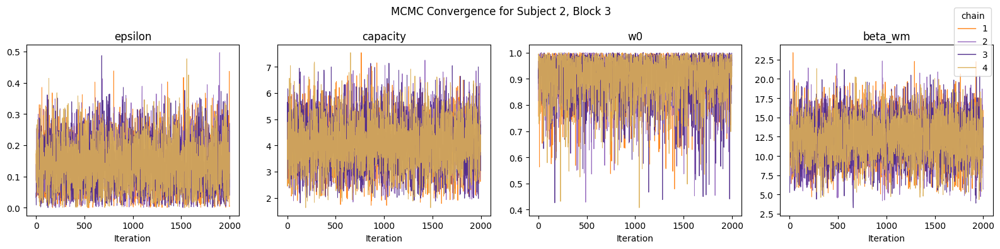


Calculating Summary Statistics (including R-hat, ESS)...
Summary Statistics:
            mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  r_hat
epsilon    0.130  0.079   0.000    0.263      0.001    0.001    4995.0    2819.0    1.0
capacity   4.051  0.955   2.220    5.770      0.011    0.011    7623.0    4773.0    1.0
w0         0.914  0.081   0.764    1.000      0.001    0.001    5068.0    3767.0    1.0
beta_wm   12.090  2.904   6.759   17.590      0.037    0.035    6158.0    3200.0    1.0
Number of samples: 8000
Performing Kernel Density Estimation...
KDE calculation finished.
Run 1: Starting optimization from initial guess: epsilon=0.5558, capacity=1.8683, w0=0.7201, beta_wm=15.2668
  epsilon: 0.555789, capacity: 1.868276, w0: 0.720092, beta_wm: 15.266763, KDE density: 2.186e-12
Run 2: Starting optimization from initial guess: epsilon=0.0144, capacity=3.7108, w0=0.8215, beta_wm=29.4963
  epsilon: 0.014431, capacity: 3.710818, w0: 0.821545, beta_wm: 29.496254, K


Building: found in cache, done.Messages from stanc:
Warning in '/tmp/httpstan_dy0nag4s/model_d7qc4gjt.stan', line 24, column 19: Argument
    12 suggests there may be parameters that are not unit scale; consider
    rescaling with a multiplier (see manual section 22.12).
    bound in its declaration. These hard constraints are not recommended, for
    two reasons: (a) Except when there are logical or physical constraints,
    it is very unusual for you to be sure that a parameter will fall inside a
    specified range, and (b) The infinite gradient induced by a hard
    constraint can cause difficulties for Stan's sampling algorithm. As a
    consequence, we recommend soft constraints rather than hard constraints;
    for example, instead of constraining an elasticity parameter to fall
    between 0, and 1, leave it unconstrained and give it a normal(0.5,0.5)
    prior distribution.
Sampling:   0%
Sampling:   2% (200/12000)
Sampling:   4% (500/12000)
Sampling:   8% (1000/12000)
Sampli

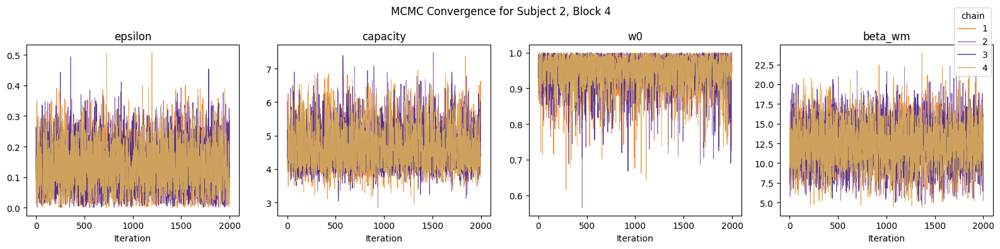


Calculating Summary Statistics (including R-hat, ESS)...
Summary Statistics:
            mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  r_hat
epsilon    0.128  0.078   0.001    0.260      0.001    0.001    5243.0    3065.0    1.0
capacity   4.659  0.635   3.681    5.928      0.010    0.009    5096.0    4035.0    1.0
w0         0.953  0.046   0.872    1.000      0.001    0.001    4844.0    3684.0    1.0
beta_wm   12.194  2.833   7.174   17.659      0.037    0.032    5658.0    4224.0    1.0
Number of samples: 8000
Performing Kernel Density Estimation...
KDE calculation finished.
Run 1: Starting optimization from initial guess: epsilon=0.4173, capacity=8.5504, w0=0.6826, beta_wm=9.6672
  epsilon: 0.417301, capacity: 8.550357, w0: 0.682605, beta_wm: 9.667240, KDE density: 2.222e-53
Run 2: Starting optimization from initial guess: epsilon=0.1766, capacity=1.6647, w0=0.8042, beta_wm=5.1712
  epsilon: 0.176572, capacity: 1.664652, w0: 0.804245, beta_wm: 5.171165, KDE d

/home/sachida/miniconda3/envs/stanenv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:596: RuntimeWarning: invalid value encountered in subtract
  df = fun(x1) - f0


  epsilon: 0.137774, capacity: 7.078728, w0: 0.976184, beta_wm: 18.126937, KDE density: 0.04438
Run 97: Starting optimization from initial guess: epsilon=0.7509, capacity=3.9233, w0=0.8668, beta_wm=27.6154
  epsilon: 0.750914, capacity: 3.923307, w0: 0.866809, beta_wm: 27.615402, KDE density: 3.007e-71
Run 98: Starting optimization from initial guess: epsilon=0.1842, capacity=2.1129, w0=0.6065, beta_wm=28.5878
  epsilon: 0.184236, capacity: 2.112861, w0: 0.606536, beta_wm: 28.587795, KDE density: 1.695e-54
Run 99: Starting optimization from initial guess: epsilon=0.9719, capacity=3.8599, w0=0.7113, beta_wm=10.6709
  epsilon: 0.971911, capacity: 3.859892, w0: 0.711307, beta_wm: 10.670872, KDE density: 2.296e-131
Run 100: Starting optimization from initial guess: epsilon=0.3766, capacity=9.0932, w0=0.5854, beta_wm=23.5498
  epsilon: 0.376573, capacity: 9.093245, w0: 0.585435, beta_wm: 23.549788, KDE density: 1.557e-117
Final epsilon: 0.0779, Final capacity: 4.2691, Final w0: 0.9808, Fina


Building: found in cache, done.Messages from stanc:
Warning in '/tmp/httpstan_dy0nag4s/model_d7qc4gjt.stan', line 24, column 19: Argument
    12 suggests there may be parameters that are not unit scale; consider
    rescaling with a multiplier (see manual section 22.12).
    bound in its declaration. These hard constraints are not recommended, for
    two reasons: (a) Except when there are logical or physical constraints,
    it is very unusual for you to be sure that a parameter will fall inside a
    specified range, and (b) The infinite gradient induced by a hard
    constraint can cause difficulties for Stan's sampling algorithm. As a
    consequence, we recommend soft constraints rather than hard constraints;
    for example, instead of constraining an elasticity parameter to fall
    between 0, and 1, leave it unconstrained and give it a normal(0.5,0.5)
    prior distribution.
Sampling:   0%
Sampling:   2% (300/12000)
Sampling:   9% (1100/12000)
Sampling:  34% (4100/12000)
Sampl

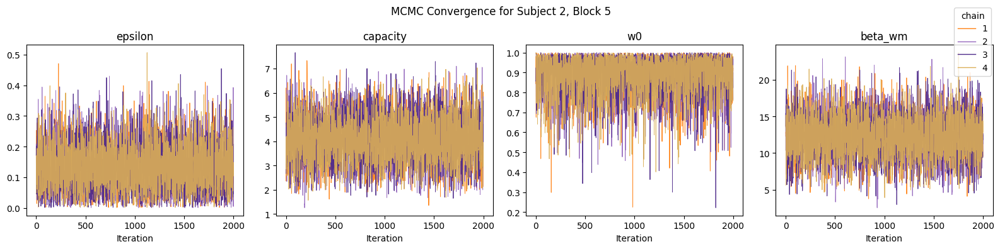


Calculating Summary Statistics (including R-hat, ESS)...
Summary Statistics:
            mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  r_hat
epsilon    0.126  0.078   0.000    0.254      0.001    0.001    4899.0    2756.0    1.0
capacity   4.026  0.965   2.216    5.793      0.011    0.011    7457.0    4330.0    1.0
w0         0.896  0.095   0.719    1.000      0.001    0.002    6547.0    4249.0    1.0
beta_wm   12.053  2.953   6.181   17.238      0.037    0.035    6145.0    3898.0    1.0
Number of samples: 8000
Performing Kernel Density Estimation...
KDE calculation finished.
Run 1: Starting optimization from initial guess: epsilon=0.7833, capacity=8.7032, w0=0.9673, beta_wm=7.3741
  epsilon: 0.783336, capacity: 8.703180, w0: 0.967271, beta_wm: 7.374095, KDE density: 2.759e-81
Run 2: Starting optimization from initial guess: epsilon=0.3406, capacity=1.2279, w0=0.5760, beta_wm=27.2399
  epsilon: 0.340581, capacity: 1.227933, w0: 0.576033, beta_wm: 27.239921, KDE


Building: found in cache, done.Messages from stanc:
Warning in '/tmp/httpstan_dy0nag4s/model_d7qc4gjt.stan', line 24, column 19: Argument
    12 suggests there may be parameters that are not unit scale; consider
    rescaling with a multiplier (see manual section 22.12).
    bound in its declaration. These hard constraints are not recommended, for
    two reasons: (a) Except when there are logical or physical constraints,
    it is very unusual for you to be sure that a parameter will fall inside a
    specified range, and (b) The infinite gradient induced by a hard
    constraint can cause difficulties for Stan's sampling algorithm. As a
    consequence, we recommend soft constraints rather than hard constraints;
    for example, instead of constraining an elasticity parameter to fall
    between 0, and 1, leave it unconstrained and give it a normal(0.5,0.5)
    prior distribution.
Sampling:   0%
Sampling:   5% (600/12000)
Sampling:  10% (1200/12000)
Sampling:  35% (4200/12000)
Sampl

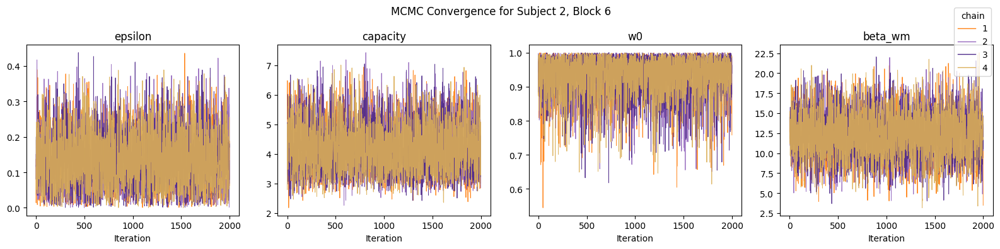


Calculating Summary Statistics (including R-hat, ESS)...
Summary Statistics:
            mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  r_hat
epsilon    0.128  0.078   0.003    0.264      0.001    0.001    5701.0    3706.0    1.0
capacity   4.216  0.832   2.821    5.768      0.010    0.008    6631.0    5861.0    1.0
w0         0.937  0.060   0.826    1.000      0.001    0.001    7093.0    4063.0    1.0
beta_wm   12.124  2.889   6.657   17.508      0.035    0.032    6784.0    4485.0    1.0
Number of samples: 8000
Performing Kernel Density Estimation...
KDE calculation finished.
Run 1: Starting optimization from initial guess: epsilon=0.2434, capacity=5.6426, w0=0.5082, beta_wm=17.1811
  epsilon: 0.243801, capacity: 5.642407, w0: 0.509793, beta_wm: 17.181108, KDE density: 1.881e-05
Run 2: Starting optimization from initial guess: epsilon=0.4743, capacity=5.4461, w0=0.9454, beta_wm=25.7551
  epsilon: 0.474295, capacity: 5.446137, w0: 0.945374, beta_wm: 25.755093, K


Building: found in cache, done.Messages from stanc:
Warning in '/tmp/httpstan_dy0nag4s/model_d7qc4gjt.stan', line 24, column 19: Argument
    12 suggests there may be parameters that are not unit scale; consider
    rescaling with a multiplier (see manual section 22.12).
    bound in its declaration. These hard constraints are not recommended, for
    two reasons: (a) Except when there are logical or physical constraints,
    it is very unusual for you to be sure that a parameter will fall inside a
    specified range, and (b) The infinite gradient induced by a hard
    constraint can cause difficulties for Stan's sampling algorithm. As a
    consequence, we recommend soft constraints rather than hard constraints;
    for example, instead of constraining an elasticity parameter to fall
    between 0, and 1, leave it unconstrained and give it a normal(0.5,0.5)
    prior distribution.
Sampling:   0%
Sampling:   2% (200/12000)
Sampling:   4% (500/12000)
Sampling:   8% (900/12000)
Samplin

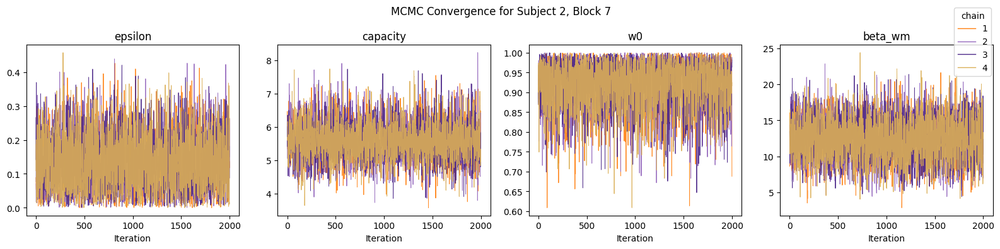


Calculating Summary Statistics (including R-hat, ESS)...
Summary Statistics:
            mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  r_hat
epsilon    0.126  0.080   0.000    0.264      0.001    0.001    3814.0    2101.0    1.0
capacity   5.608  0.541   4.583    6.657      0.008    0.008    5267.0    4535.0    1.0
w0         0.926  0.057   0.823    1.000      0.001    0.001    4109.0    2530.0    1.0
beta_wm   12.167  2.859   7.176   17.829      0.037    0.030    5932.0    4541.0    1.0
Number of samples: 8000
Performing Kernel Density Estimation...
KDE calculation finished.
Run 1: Starting optimization from initial guess: epsilon=0.1609, capacity=5.0079, w0=0.5501, beta_wm=14.3699
  epsilon: 0.160919, capacity: 5.007907, w0: 0.550098, beta_wm: 14.369934, KDE density: 3.096e-08
Run 2: Starting optimization from initial guess: epsilon=0.7716, capacity=2.1319, w0=0.7640, beta_wm=27.0973
  epsilon: 0.771566, capacity: 2.131930, w0: 0.763995, beta_wm: 27.097251, K

/home/sachida/miniconda3/envs/stanenv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:596: RuntimeWarning: invalid value encountered in subtract
  df = fun(x1) - f0


  epsilon: 0.282183, capacity: 8.390932, w0: 0.823458, beta_wm: 26.277808, KDE density: 1.773e-35
Run 39: Starting optimization from initial guess: epsilon=0.5344, capacity=2.1472, w0=0.5850, beta_wm=14.9249
  epsilon: 0.534403, capacity: 2.147151, w0: 0.585042, beta_wm: 14.924944, KDE density: 2.773e-86
Run 40: Starting optimization from initial guess: epsilon=0.7939, capacity=6.8289, w0=0.9703, beta_wm=11.2778
  epsilon: 0.793941, capacity: 6.828864, w0: 0.970300, beta_wm: 11.277767, KDE density: 8.082e-46
Run 41: Starting optimization from initial guess: epsilon=0.1892, capacity=4.2896, w0=0.6296, beta_wm=23.8878
  epsilon: 0.189179, capacity: 4.289580, w0: 0.629648, beta_wm: 23.887752, KDE density: 4.978e-17
Run 42: Starting optimization from initial guess: epsilon=0.5227, capacity=1.8446, w0=0.7460, beta_wm=16.8448
  epsilon: 0.522711, capacity: 1.844557, w0: 0.745959, beta_wm: 16.844784, KDE density: 4.317e-67
Run 43: Starting optimization from initial guess: epsilon=0.5259, capa


Building: found in cache, done.Messages from stanc:
Warning in '/tmp/httpstan_dy0nag4s/model_d7qc4gjt.stan', line 24, column 19: Argument
    12 suggests there may be parameters that are not unit scale; consider
    rescaling with a multiplier (see manual section 22.12).
    bound in its declaration. These hard constraints are not recommended, for
    two reasons: (a) Except when there are logical or physical constraints,
    it is very unusual for you to be sure that a parameter will fall inside a
    specified range, and (b) The infinite gradient induced by a hard
    constraint can cause difficulties for Stan's sampling algorithm. As a
    consequence, we recommend soft constraints rather than hard constraints;
    for example, instead of constraining an elasticity parameter to fall
    between 0, and 1, leave it unconstrained and give it a normal(0.5,0.5)
    prior distribution.
Sampling:   0%
Sampling:   7% (800/12000)
Sampling:  32% (3800/12000)
Sampling:  57% (6800/12000)
Sampl

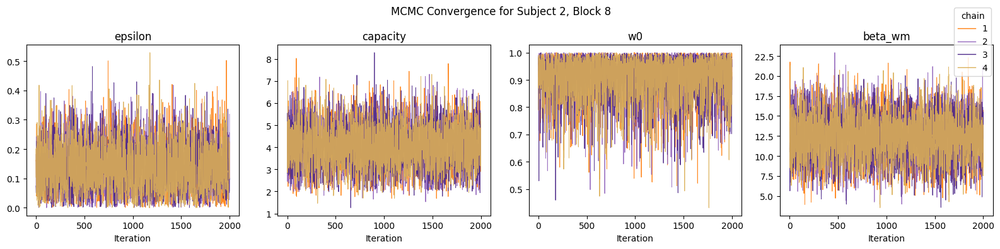


Calculating Summary Statistics (including R-hat, ESS)...
Summary Statistics:
            mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  r_hat
epsilon    0.129  0.080   0.000    0.264      0.001    0.001    4858.0    3014.0    1.0
capacity   4.032  0.973   2.070    5.671      0.011    0.011    8042.0    5257.0    1.0
w0         0.916  0.078   0.773    1.000      0.001    0.001    6629.0    3450.0    1.0
beta_wm   12.111  2.875   6.659   17.327      0.034    0.033    6760.0    4185.0    1.0
Number of samples: 8000
Performing Kernel Density Estimation...
KDE calculation finished.
Run 1: Starting optimization from initial guess: epsilon=0.1369, capacity=1.5317, w0=0.7357, beta_wm=9.2818
  epsilon: 0.092547, capacity: 3.960025, w0: 0.970725, beta_wm: 12.156098, KDE density: 1.874
Run 2: Starting optimization from initial guess: epsilon=0.4878, capacity=6.9833, w0=0.8285, beta_wm=10.4818
  epsilon: 0.487764, capacity: 6.983302, w0: 0.828542, beta_wm: 10.481827, KDE de


Building: found in cache, done.Messages from stanc:
Warning in '/tmp/httpstan_dy0nag4s/model_d7qc4gjt.stan', line 24, column 19: Argument
    12 suggests there may be parameters that are not unit scale; consider
    rescaling with a multiplier (see manual section 22.12).
    bound in its declaration. These hard constraints are not recommended, for
    two reasons: (a) Except when there are logical or physical constraints,
    it is very unusual for you to be sure that a parameter will fall inside a
    specified range, and (b) The infinite gradient induced by a hard
    constraint can cause difficulties for Stan's sampling algorithm. As a
    consequence, we recommend soft constraints rather than hard constraints;
    for example, instead of constraining an elasticity parameter to fall
    between 0, and 1, leave it unconstrained and give it a normal(0.5,0.5)
    prior distribution.
Sampling:   0%
Sampling:   2% (200/12000)
Sampling:   5% (600/12000)
Sampling:  11% (1300/12000)
Sampli

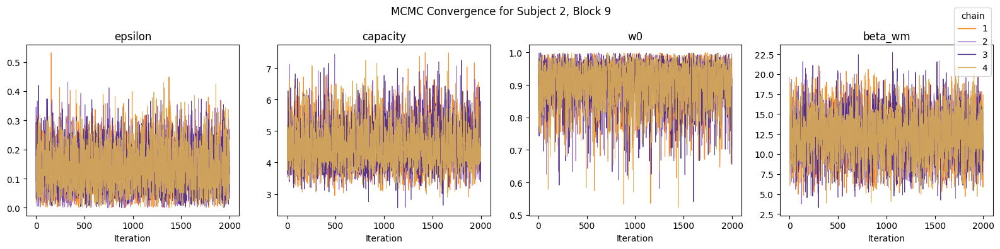


Calculating Summary Statistics (including R-hat, ESS)...
Summary Statistics:
            mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  r_hat
epsilon    0.128  0.080   0.000    0.264      0.001    0.001    4625.0    2361.0    1.0
capacity   4.533  0.696   3.322    5.847      0.010    0.009    4606.0    4861.0    1.0
w0         0.909  0.066   0.791    1.000      0.001    0.001    3545.0    1694.0    1.0
beta_wm   12.049  2.948   6.438   17.511      0.039    0.034    5701.0    3539.0    1.0
Number of samples: 8000
Performing Kernel Density Estimation...
KDE calculation finished.
Run 1: Starting optimization from initial guess: epsilon=0.1155, capacity=8.7925, w0=0.5838, beta_wm=13.4203
  epsilon: 0.115494, capacity: 8.792527, w0: 0.583777, beta_wm: 13.420342, KDE density: 1.447e-28
Run 2: Starting optimization from initial guess: epsilon=0.5563, capacity=5.0469, w0=0.9717, beta_wm=17.4633
  epsilon: 0.556300, capacity: 5.046914, w0: 0.971686, beta_wm: 17.463340, K


Building: found in cache, done.Messages from stanc:
Warning in '/tmp/httpstan_dy0nag4s/model_d7qc4gjt.stan', line 24, column 19: Argument
    12 suggests there may be parameters that are not unit scale; consider
    rescaling with a multiplier (see manual section 22.12).
    bound in its declaration. These hard constraints are not recommended, for
    two reasons: (a) Except when there are logical or physical constraints,
    it is very unusual for you to be sure that a parameter will fall inside a
    specified range, and (b) The infinite gradient induced by a hard
    constraint can cause difficulties for Stan's sampling algorithm. As a
    consequence, we recommend soft constraints rather than hard constraints;
    for example, instead of constraining an elasticity parameter to fall
    between 0, and 1, leave it unconstrained and give it a normal(0.5,0.5)
    prior distribution.
Sampling:   0%
Sampling:   1% (100/12000)
Sampling:   2% (300/12000)
Sampling:   6% (700/12000)
Samplin

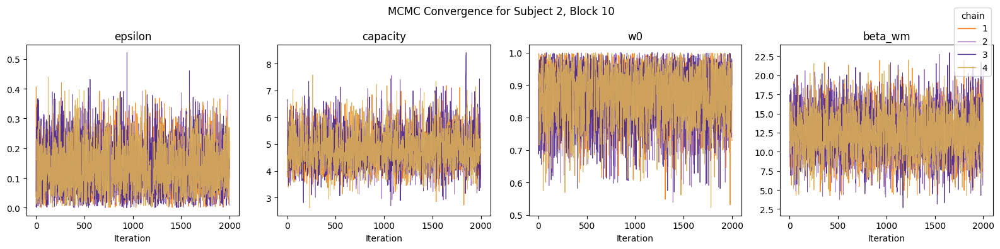


Calculating Summary Statistics (including R-hat, ESS)...
Summary Statistics:
            mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  r_hat
epsilon    0.126  0.080   0.000    0.263      0.001    0.001    4039.0    2188.0    1.0
capacity   4.816  0.661   3.603    6.068      0.010    0.012    4420.0    4159.0    1.0
w0         0.878  0.081   0.738    1.000      0.001    0.001    3848.0    2228.0    1.0
beta_wm   12.105  2.927   6.604   17.568      0.038    0.036    5733.0    3714.0    1.0
Number of samples: 8000
Performing Kernel Density Estimation...
KDE calculation finished.
Run 1: Starting optimization from initial guess: epsilon=0.1478, capacity=4.4726, w0=0.9729, beta_wm=28.6336
  epsilon: 0.147804, capacity: 4.472605, w0: 0.972948, beta_wm: 28.633629, KDE density: 1.083e-13
Run 2: Starting optimization from initial guess: epsilon=0.7879, capacity=9.4617, w0=0.9631, beta_wm=4.8135
  epsilon: 0.787877, capacity: 9.461741, w0: 0.963121, beta_wm: 4.813508, KDE


Building: found in cache, done.Messages from stanc:
Warning in '/tmp/httpstan_dy0nag4s/model_d7qc4gjt.stan', line 24, column 19: Argument
    12 suggests there may be parameters that are not unit scale; consider
    rescaling with a multiplier (see manual section 22.12).
    bound in its declaration. These hard constraints are not recommended, for
    two reasons: (a) Except when there are logical or physical constraints,
    it is very unusual for you to be sure that a parameter will fall inside a
    specified range, and (b) The infinite gradient induced by a hard
    constraint can cause difficulties for Stan's sampling algorithm. As a
    consequence, we recommend soft constraints rather than hard constraints;
    for example, instead of constraining an elasticity parameter to fall
    between 0, and 1, leave it unconstrained and give it a normal(0.5,0.5)
    prior distribution.
Sampling:   0%
Sampling:   1% (100/12000)
Sampling:   2% (300/12000)
Sampling:   5% (600/12000)
Samplin

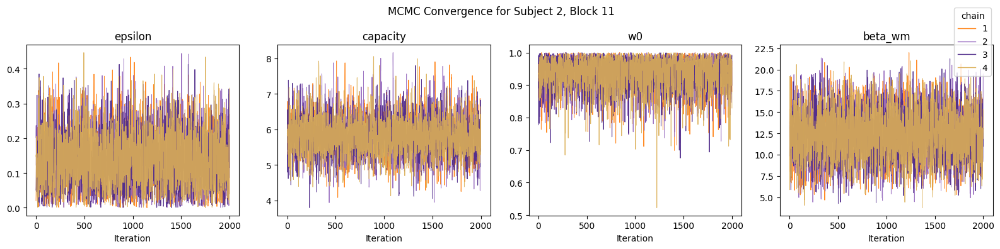


Calculating Summary Statistics (including R-hat, ESS)...
Summary Statistics:
            mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  r_hat
epsilon    0.127  0.078   0.000    0.259      0.001    0.001    3991.0    2484.0    1.0
capacity   5.833  0.528   4.807    6.836      0.008    0.009    4749.0    3524.0    1.0
w0         0.943  0.047   0.858    1.000      0.001    0.001    4378.0    2595.0    1.0
beta_wm   12.187  2.856   7.028   17.647      0.036    0.031    6288.0    4278.0    1.0
Number of samples: 8000
Performing Kernel Density Estimation...
KDE calculation finished.
Run 1: Starting optimization from initial guess: epsilon=0.6601, capacity=3.4956, w0=0.7209, beta_wm=6.5802
  epsilon: 0.660057, capacity: 3.495606, w0: 0.720910, beta_wm: 6.580190, KDE density: 4.303e-89
Run 2: Starting optimization from initial guess: epsilon=0.5242, capacity=7.9629, w0=0.6505, beta_wm=14.8767
  epsilon: 0.524206, capacity: 7.962851, w0: 0.650463, beta_wm: 14.876747, KDE


Building: found in cache, done.Messages from stanc:
Warning in '/tmp/httpstan_dy0nag4s/model_d7qc4gjt.stan', line 24, column 19: Argument
    12 suggests there may be parameters that are not unit scale; consider
    rescaling with a multiplier (see manual section 22.12).
    bound in its declaration. These hard constraints are not recommended, for
    two reasons: (a) Except when there are logical or physical constraints,
    it is very unusual for you to be sure that a parameter will fall inside a
    specified range, and (b) The infinite gradient induced by a hard
    constraint can cause difficulties for Stan's sampling algorithm. As a
    consequence, we recommend soft constraints rather than hard constraints;
    for example, instead of constraining an elasticity parameter to fall
    between 0, and 1, leave it unconstrained and give it a normal(0.5,0.5)
    prior distribution.
Sampling:   0%
Sampling:   2% (300/12000)
Sampling:   8% (1000/12000)
Sampling:  33% (4000/12000)
Sampl

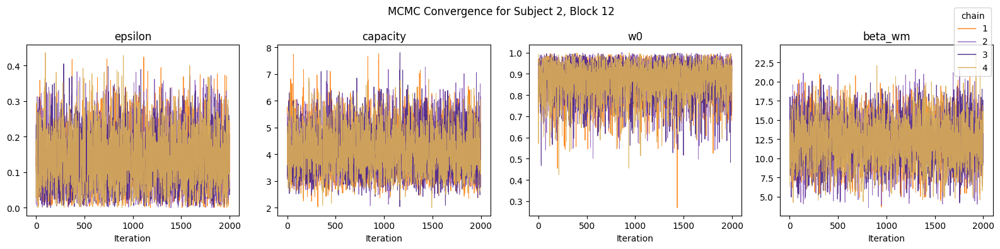


Calculating Summary Statistics (including R-hat, ESS)...
Summary Statistics:
            mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  r_hat
epsilon    0.129  0.079   0.000    0.261      0.001    0.001    4266.0    2771.0    1.0
capacity   4.189  0.876   2.688    5.803      0.011    0.011    5842.0    4527.0    1.0
w0         0.878  0.083   0.731    1.000      0.001    0.001    6365.0    3794.0    1.0
beta_wm   12.045  2.922   6.408   17.498      0.035    0.035    6865.0    3894.0    1.0
Number of samples: 8000
Performing Kernel Density Estimation...
KDE calculation finished.
Run 1: Starting optimization from initial guess: epsilon=0.8519, capacity=1.1079, w0=0.8186, beta_wm=1.1417
  epsilon: 0.851939, capacity: 1.107858, w0: 0.818554, beta_wm: 1.141659, KDE density: 1.659e-99
Run 2: Starting optimization from initial guess: epsilon=0.5863, capacity=7.5148, w0=0.9426, beta_wm=3.1731
  epsilon: 0.586294, capacity: 7.514775, w0: 0.942602, beta_wm: 3.173105, KDE d


Building: found in cache, done.Messages from stanc:
Warning in '/tmp/httpstan_dy0nag4s/model_d7qc4gjt.stan', line 24, column 19: Argument
    12 suggests there may be parameters that are not unit scale; consider
    rescaling with a multiplier (see manual section 22.12).
    bound in its declaration. These hard constraints are not recommended, for
    two reasons: (a) Except when there are logical or physical constraints,
    it is very unusual for you to be sure that a parameter will fall inside a
    specified range, and (b) The infinite gradient induced by a hard
    constraint can cause difficulties for Stan's sampling algorithm. As a
    consequence, we recommend soft constraints rather than hard constraints;
    for example, instead of constraining an elasticity parameter to fall
    between 0, and 1, leave it unconstrained and give it a normal(0.5,0.5)
    prior distribution.
Sampling:   0%
Sampling:   1% (100/12000)
Sampling:   3% (400/12000)
Sampling:   7% (800/12000)
Samplin

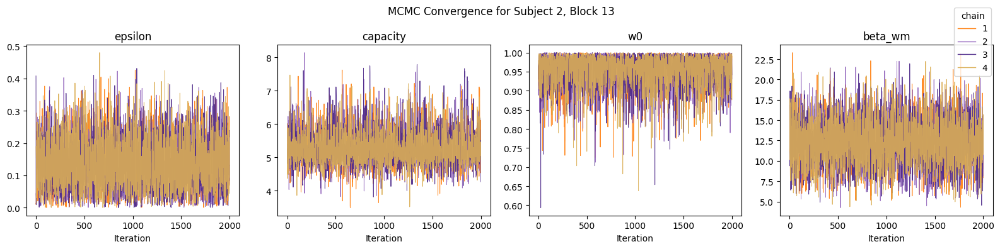


Calculating Summary Statistics (including R-hat, ESS)...
Summary Statistics:
            mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  r_hat
epsilon    0.127  0.078   0.000    0.260      0.001    0.001    4523.0    2514.0    1.0
capacity   5.313  0.522   4.383    6.350      0.008    0.010    5082.0    3468.0    1.0
w0         0.959  0.040   0.887    1.000      0.000    0.001    5019.0    3373.0    1.0
beta_wm   12.193  2.812   6.711   17.298      0.040    0.032    4726.0    3930.0    1.0
Number of samples: 8000
Performing Kernel Density Estimation...
KDE calculation finished.
Run 1: Starting optimization from initial guess: epsilon=0.0626, capacity=3.1287, w0=0.9225, beta_wm=14.3180
  epsilon: 0.103781, capacity: 5.106967, w0: 0.983113, beta_wm: 12.157559, KDE density: 7.922
Run 2: Starting optimization from initial guess: epsilon=0.9700, capacity=4.5765, w0=0.5030, beta_wm=8.3703
  epsilon: 0.969963, capacity: 4.576459, w0: 0.502954, beta_wm: 8.370315, KDE den

/home/sachida/miniconda3/envs/stanenv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:596: RuntimeWarning: invalid value encountered in subtract
  df = fun(x1) - f0


  epsilon: 0.103809, capacity: 5.107401, w0: 0.983125, beta_wm: 12.159678, KDE density: 7.922
Run 39: Starting optimization from initial guess: epsilon=0.0287, capacity=4.3439, w0=0.6538, beta_wm=29.8796
  epsilon: 0.028743, capacity: 4.343939, w0: 0.653799, beta_wm: 29.879563, KDE density: 7.755e-57
Run 40: Starting optimization from initial guess: epsilon=0.6248, capacity=3.4350, w0=0.5352, beta_wm=5.1168
  epsilon: 0.624835, capacity: 3.435046, w0: 0.535223, beta_wm: 5.116802, KDE density: 1.143e-119
Run 41: Starting optimization from initial guess: epsilon=0.6021, capacity=1.8085, w0=0.8884, beta_wm=24.9337
  epsilon: 0.602121, capacity: 1.808517, w0: 0.888351, beta_wm: 24.933693, KDE density: 1.699e-101
Run 42: Starting optimization from initial guess: epsilon=0.3743, capacity=6.2194, w0=0.9029, beta_wm=17.7719
  epsilon: 0.289460, capacity: 6.038014, w0: 0.841569, beta_wm: 16.909473, KDE density: 0.06132
Run 43: Starting optimization from initial guess: epsilon=0.3666, capacity=5


Building: found in cache, done.Messages from stanc:
Warning in '/tmp/httpstan_dy0nag4s/model_d7qc4gjt.stan', line 24, column 19: Argument
    12 suggests there may be parameters that are not unit scale; consider
    rescaling with a multiplier (see manual section 22.12).
    bound in its declaration. These hard constraints are not recommended, for
    two reasons: (a) Except when there are logical or physical constraints,
    it is very unusual for you to be sure that a parameter will fall inside a
    specified range, and (b) The infinite gradient induced by a hard
    constraint can cause difficulties for Stan's sampling algorithm. As a
    consequence, we recommend soft constraints rather than hard constraints;
    for example, instead of constraining an elasticity parameter to fall
    between 0, and 1, leave it unconstrained and give it a normal(0.5,0.5)
    prior distribution.
Sampling:   0%
Sampling:   4% (500/12000)
Sampling:  29% (3500/12000)
Sampling:  54% (6500/12000)
Sampl

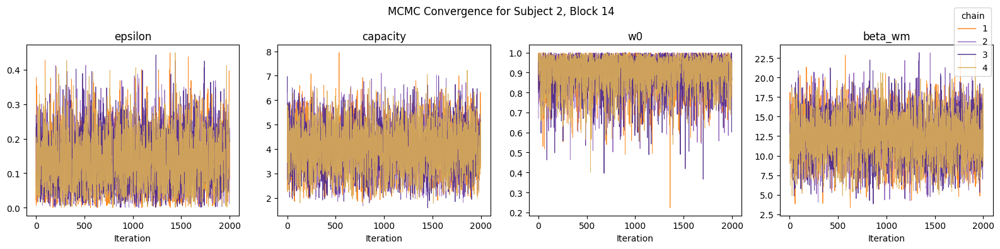


Calculating Summary Statistics (including R-hat, ESS)...
Summary Statistics:
            mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  r_hat
epsilon    0.130  0.078   0.000    0.262      0.001    0.001    5011.0    2859.0    1.0
capacity   4.023  0.937   2.305    5.820      0.011    0.010    7504.0    5034.0    1.0
w0         0.911  0.084   0.752    1.000      0.001    0.001    6542.0    3611.0    1.0
beta_wm   12.095  2.941   6.405   17.361      0.034    0.034    7132.0    4433.0    1.0
Number of samples: 8000
Performing Kernel Density Estimation...
KDE calculation finished.
Run 1: Starting optimization from initial guess: epsilon=0.6355, capacity=2.3991, w0=0.7424, beta_wm=13.9396
  epsilon: 0.635524, capacity: 2.399050, w0: 0.742386, beta_wm: 13.939560, KDE density: 3.331e-24
Run 2: Starting optimization from initial guess: epsilon=0.2007, capacity=4.4002, w0=0.6261, beta_wm=18.8798
  epsilon: 0.101315, capacity: 4.907000, w0: 0.874792, beta_wm: 17.183994, K


Building: found in cache, done.Messages from stanc:
Warning in '/tmp/httpstan_dy0nag4s/model_d7qc4gjt.stan', line 24, column 19: Argument
    12 suggests there may be parameters that are not unit scale; consider
    rescaling with a multiplier (see manual section 22.12).
    bound in its declaration. These hard constraints are not recommended, for
    two reasons: (a) Except when there are logical or physical constraints,
    it is very unusual for you to be sure that a parameter will fall inside a
    specified range, and (b) The infinite gradient induced by a hard
    constraint can cause difficulties for Stan's sampling algorithm. As a
    consequence, we recommend soft constraints rather than hard constraints;
    for example, instead of constraining an elasticity parameter to fall
    between 0, and 1, leave it unconstrained and give it a normal(0.5,0.5)
    prior distribution.
Sampling:   0%
Sampling:   2% (300/12000)
Sampling:   8% (900/12000)
Sampling:  12% (1500/12000)
Sampli

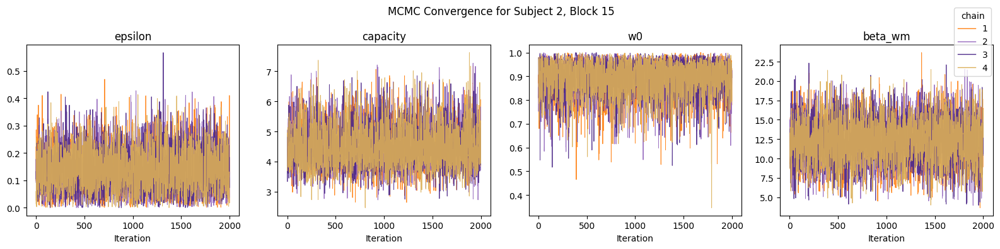


Calculating Summary Statistics (including R-hat, ESS)...
Summary Statistics:
            mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  r_hat
epsilon    0.129  0.079   0.000    0.263      0.001    0.001    4076.0    1882.0    1.0
capacity   4.516  0.722   3.264    5.924      0.010    0.009    5283.0    4908.0    1.0
w0         0.897  0.073   0.768    1.000      0.001    0.001    4665.0    2308.0    1.0
beta_wm   12.032  2.890   6.573   17.463      0.036    0.032    6374.0    4237.0    1.0
Number of samples: 8000
Performing Kernel Density Estimation...
KDE calculation finished.
Run 1: Starting optimization from initial guess: epsilon=0.5608, capacity=2.0434, w0=0.5958, beta_wm=3.0487
  epsilon: 0.560761, capacity: 2.043359, w0: 0.595827, beta_wm: 3.048695, KDE density: 1.625e-56
Run 2: Starting optimization from initial guess: epsilon=0.1781, capacity=1.9956, w0=0.7412, beta_wm=7.3075
  epsilon: 0.178136, capacity: 1.995558, w0: 0.741241, beta_wm: 7.307486, KDE d


Building: found in cache, done.Messages from stanc:
Warning in '/tmp/httpstan_dy0nag4s/model_d7qc4gjt.stan', line 24, column 19: Argument
    12 suggests there may be parameters that are not unit scale; consider
    rescaling with a multiplier (see manual section 22.12).
    bound in its declaration. These hard constraints are not recommended, for
    two reasons: (a) Except when there are logical or physical constraints,
    it is very unusual for you to be sure that a parameter will fall inside a
    specified range, and (b) The infinite gradient induced by a hard
    constraint can cause difficulties for Stan's sampling algorithm. As a
    consequence, we recommend soft constraints rather than hard constraints;
    for example, instead of constraining an elasticity parameter to fall
    between 0, and 1, leave it unconstrained and give it a normal(0.5,0.5)
    prior distribution.
Sampling:   0%
Sampling:   5% (600/12000)
Sampling:  30% (3600/12000)
Sampling:  55% (6600/12000)
Sampl

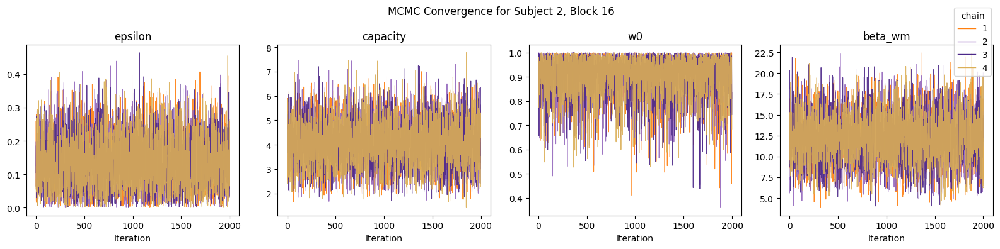


Calculating Summary Statistics (including R-hat, ESS)...
Summary Statistics:
            mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  r_hat
epsilon    0.126  0.079   0.000    0.263      0.001    0.001    5072.0    2805.0    1.0
capacity   4.033  0.952   2.258    5.799      0.011    0.011    7114.0    4859.0    1.0
w0         0.914  0.081   0.760    1.000      0.001    0.001    6035.0    3570.0    1.0
beta_wm   12.048  2.944   6.164   17.232      0.038    0.035    5704.0    3752.0    1.0
Number of samples: 8000
Performing Kernel Density Estimation...
KDE calculation finished.
Run 1: Starting optimization from initial guess: epsilon=0.7556, capacity=4.4022, w0=0.5630, beta_wm=19.7303
  epsilon: 0.755568, capacity: 4.402168, w0: 0.562951, beta_wm: 19.730282, KDE density: 1.548e-60
Run 2: Starting optimization from initial guess: epsilon=0.1100, capacity=2.0914, w0=0.9945, beta_wm=14.7815
  epsilon: 0.104416, capacity: 3.993183, w0: 0.968527, beta_wm: 12.207050, K


Building: found in cache, done.Messages from stanc:
Warning in '/tmp/httpstan_dy0nag4s/model_d7qc4gjt.stan', line 24, column 19: Argument
    12 suggests there may be parameters that are not unit scale; consider
    rescaling with a multiplier (see manual section 22.12).
    bound in its declaration. These hard constraints are not recommended, for
    two reasons: (a) Except when there are logical or physical constraints,
    it is very unusual for you to be sure that a parameter will fall inside a
    specified range, and (b) The infinite gradient induced by a hard
    constraint can cause difficulties for Stan's sampling algorithm. As a
    consequence, we recommend soft constraints rather than hard constraints;
    for example, instead of constraining an elasticity parameter to fall
    between 0, and 1, leave it unconstrained and give it a normal(0.5,0.5)
    prior distribution.
Sampling:   0%
Sampling:   3% (400/12000)
Sampling:  10% (1200/12000)
Sampling:  35% (4200/12000)
Sampl

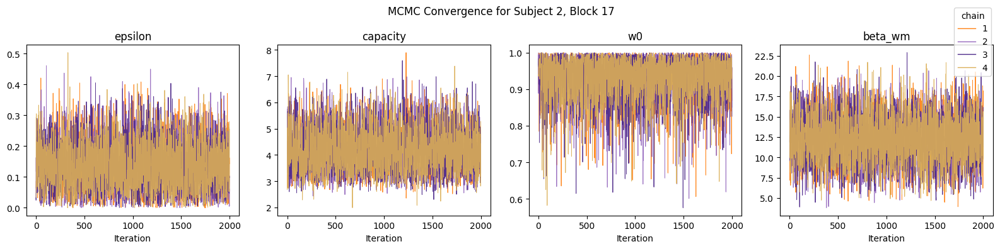


Calculating Summary Statistics (including R-hat, ESS)...
Summary Statistics:
            mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  r_hat
epsilon    0.127  0.079   0.000    0.262      0.001    0.001    4455.0    2375.0    1.0
capacity   4.207  0.829   2.821    5.735      0.011    0.009    6389.0    4987.0    1.0
w0         0.938  0.059   0.831    1.000      0.001    0.001    6171.0    3610.0    1.0
beta_wm   12.095  2.923   6.844   17.754      0.036    0.032    6582.0    4663.0    1.0
Number of samples: 8000
Performing Kernel Density Estimation...
KDE calculation finished.
Run 1: Starting optimization from initial guess: epsilon=0.8874, capacity=1.8024, w0=0.7209, beta_wm=16.9411
  epsilon: 0.887372, capacity: 1.802401, w0: 0.720866, beta_wm: 16.941059, KDE density: 6.612e-82
Run 2: Starting optimization from initial guess: epsilon=0.6392, capacity=8.6434, w0=0.7810, beta_wm=9.3393
  epsilon: 0.639177, capacity: 8.643386, w0: 0.780953, beta_wm: 9.339299, KDE


Building: found in cache, done.Messages from stanc:
Warning in '/tmp/httpstan_dy0nag4s/model_d7qc4gjt.stan', line 24, column 19: Argument
    12 suggests there may be parameters that are not unit scale; consider
    rescaling with a multiplier (see manual section 22.12).
    bound in its declaration. These hard constraints are not recommended, for
    two reasons: (a) Except when there are logical or physical constraints,
    it is very unusual for you to be sure that a parameter will fall inside a
    specified range, and (b) The infinite gradient induced by a hard
    constraint can cause difficulties for Stan's sampling algorithm. As a
    consequence, we recommend soft constraints rather than hard constraints;
    for example, instead of constraining an elasticity parameter to fall
    between 0, and 1, leave it unconstrained and give it a normal(0.5,0.5)
    prior distribution.
Sampling:   0%
Sampling:   0% (1/12000)
Sampling:   2% (201/12000)
Sampling:   4% (501/12000)
Sampling:

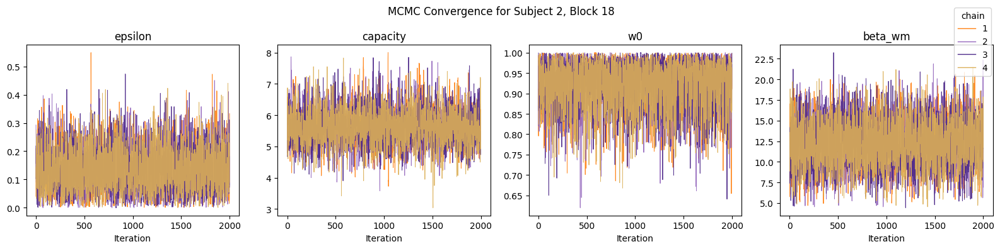


Calculating Summary Statistics (including R-hat, ESS)...
Summary Statistics:
            mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  r_hat
epsilon    0.128  0.079   0.000    0.261      0.001    0.001    3778.0    2493.0    1.0
capacity   5.640  0.570   4.536    6.718      0.008    0.009    4860.0    3523.0    1.0
w0         0.928  0.057   0.825    1.000      0.001    0.001    4388.0    2858.0    1.0
beta_wm   12.153  2.868   6.537   17.338      0.038    0.031    5718.0    4087.0    1.0
Number of samples: 8000
Performing Kernel Density Estimation...
KDE calculation finished.
Run 1: Starting optimization from initial guess: epsilon=0.6974, capacity=7.6000, w0=0.9701, beta_wm=20.6303
  epsilon: 0.697424, capacity: 7.600035, w0: 0.970051, beta_wm: 20.630339, KDE density: 1.331e-47
Run 2: Starting optimization from initial guess: epsilon=0.6594, capacity=2.1788, w0=0.8749, beta_wm=6.8577
  epsilon: 0.659417, capacity: 2.178804, w0: 0.874906, beta_wm: 6.857662, KDE

/home/sachida/miniconda3/envs/stanenv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:596: RuntimeWarning: invalid value encountered in subtract
  df = fun(x1) - f0


  epsilon: 0.561030, capacity: 2.758035, w0: 0.933353, beta_wm: 19.040939, KDE density: 1.72e-39
Run 16: Starting optimization from initial guess: epsilon=0.0872, capacity=1.6231, w0=0.9989, beta_wm=10.6444
  epsilon: 0.087163, capacity: 1.623058, w0: 0.998903, beta_wm: 10.644359, KDE density: 7.082e-20
Run 17: Starting optimization from initial guess: epsilon=0.9070, capacity=9.7924, w0=0.7004, beta_wm=27.7371
  epsilon: 0.906975, capacity: 9.792356, w0: 0.700428, beta_wm: 27.737081, KDE density: 1.665e-162
Run 18: Starting optimization from initial guess: epsilon=0.7581, capacity=5.2564, w0=0.9571, beta_wm=17.7421
  epsilon: 0.758146, capacity: 5.256426, w0: 0.957098, beta_wm: 17.742144, KDE density: 7.265e-41
Run 19: Starting optimization from initial guess: epsilon=0.5561, capacity=2.3630, w0=0.8044, beta_wm=13.1787
  epsilon: 0.556094, capacity: 2.362991, w0: 0.804382, beta_wm: 13.178734, KDE density: 3.084e-59
Run 20: Starting optimization from initial guess: epsilon=0.1769, capa


Building: found in cache, done.Messages from stanc:
Warning in '/tmp/httpstan_dy0nag4s/model_d7qc4gjt.stan', line 24, column 19: Argument
    12 suggests there may be parameters that are not unit scale; consider
    rescaling with a multiplier (see manual section 22.12).
    bound in its declaration. These hard constraints are not recommended, for
    two reasons: (a) Except when there are logical or physical constraints,
    it is very unusual for you to be sure that a parameter will fall inside a
    specified range, and (b) The infinite gradient induced by a hard
    constraint can cause difficulties for Stan's sampling algorithm. As a
    consequence, we recommend soft constraints rather than hard constraints;
    for example, instead of constraining an elasticity parameter to fall
    between 0, and 1, leave it unconstrained and give it a normal(0.5,0.5)
    prior distribution.
Sampling:   0%
Sampling:   1% (100/12000)
Sampling:   2% (300/12000)
Sampling:   4% (500/12000)
Samplin

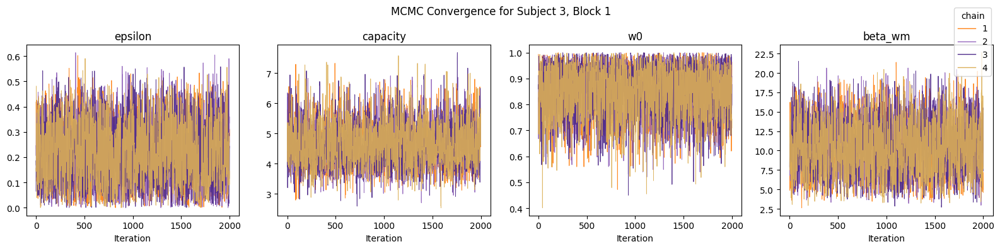


Calculating Summary Statistics (including R-hat, ESS)...
Summary Statistics:
            mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  r_hat
epsilon    0.210  0.123   0.000    0.413      0.002    0.001    3222.0    2332.0    1.0
capacity   4.646  0.714   3.339    5.970      0.012    0.009    3600.0    3914.0    1.0
w0         0.856  0.097   0.687    1.000      0.002    0.001    3486.0    2759.0    1.0
beta_wm   10.272  3.371   4.488   16.435      0.059    0.031    3139.0    4114.0    1.0
Number of samples: 8000
Performing Kernel Density Estimation...
KDE calculation finished.
Run 1: Starting optimization from initial guess: epsilon=0.3609, capacity=9.1900, w0=0.5510, beta_wm=3.9886
  epsilon: 0.360904, capacity: 9.190041, w0: 0.550962, beta_wm: 3.988624, KDE density: 3.342e-20
Run 2: Starting optimization from initial guess: epsilon=0.1787, capacity=9.9475, w0=0.7214, beta_wm=1.0164
  epsilon: 0.178736, capacity: 9.947528, w0: 0.721423, beta_wm: 1.016381, KDE d


Building: found in cache, done.Messages from stanc:
Warning in '/tmp/httpstan_dy0nag4s/model_d7qc4gjt.stan', line 24, column 19: Argument
    12 suggests there may be parameters that are not unit scale; consider
    rescaling with a multiplier (see manual section 22.12).
    bound in its declaration. These hard constraints are not recommended, for
    two reasons: (a) Except when there are logical or physical constraints,
    it is very unusual for you to be sure that a parameter will fall inside a
    specified range, and (b) The infinite gradient induced by a hard
    constraint can cause difficulties for Stan's sampling algorithm. As a
    consequence, we recommend soft constraints rather than hard constraints;
    for example, instead of constraining an elasticity parameter to fall
    between 0, and 1, leave it unconstrained and give it a normal(0.5,0.5)
    prior distribution.
Sampling:   0%
Sampling:   2% (200/12000)
Sampling:   5% (600/12000)
Sampling:   9% (1100/12000)
Sampli

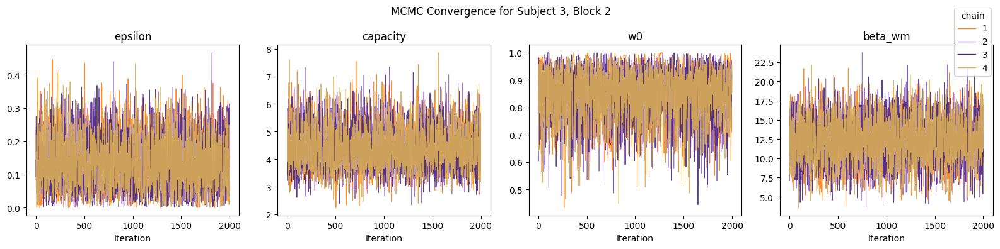


Calculating Summary Statistics (including R-hat, ESS)...
Summary Statistics:
            mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  r_hat
epsilon    0.128  0.077   0.000    0.260      0.001    0.001    4660.0    2728.0    1.0
capacity   4.401  0.771   2.989    5.810      0.012    0.010    4433.0    4588.0    1.0
w0         0.856  0.088   0.701    1.000      0.001    0.001    2637.0    1092.0    1.0
beta_wm   12.064  2.929   6.686   17.583      0.038    0.032    5875.0    3934.0    1.0
Number of samples: 8000
Performing Kernel Density Estimation...
KDE calculation finished.
Run 1: Starting optimization from initial guess: epsilon=0.9188, capacity=8.0249, w0=0.6145, beta_wm=27.8193
  epsilon: 0.918789, capacity: 8.024937, w0: 0.614469, beta_wm: 27.819294, KDE density: 4.574e-144
Run 2: Starting optimization from initial guess: epsilon=0.6339, capacity=2.4064, w0=0.5991, beta_wm=25.7802
  epsilon: 0.633859, capacity: 2.406373, w0: 0.599103, beta_wm: 25.780240, 


Building: found in cache, done.Messages from stanc:
Warning in '/tmp/httpstan_dy0nag4s/model_d7qc4gjt.stan', line 24, column 19: Argument
    12 suggests there may be parameters that are not unit scale; consider
    rescaling with a multiplier (see manual section 22.12).
    bound in its declaration. These hard constraints are not recommended, for
    two reasons: (a) Except when there are logical or physical constraints,
    it is very unusual for you to be sure that a parameter will fall inside a
    specified range, and (b) The infinite gradient induced by a hard
    constraint can cause difficulties for Stan's sampling algorithm. As a
    consequence, we recommend soft constraints rather than hard constraints;
    for example, instead of constraining an elasticity parameter to fall
    between 0, and 1, leave it unconstrained and give it a normal(0.5,0.5)
    prior distribution.
Sampling:   0%
Sampling:   2% (300/12000)
Sampling:   9% (1100/12000)
Sampling:  34% (4100/12000)
Sampl

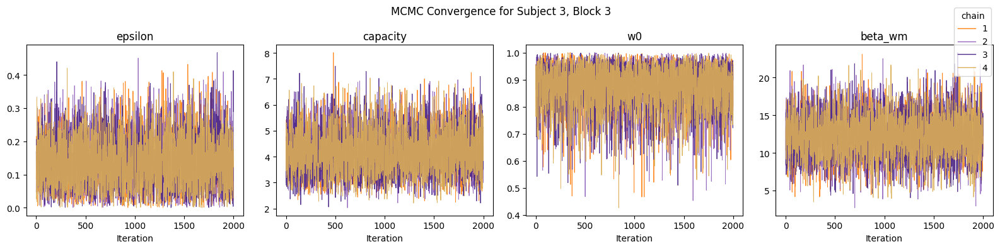


Calculating Summary Statistics (including R-hat, ESS)...
Summary Statistics:
            mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  r_hat
epsilon    0.131  0.079   0.000    0.265      0.001    0.001    5145.0    3370.0    1.0
capacity   4.185  0.868   2.697    5.824      0.011    0.009    6522.0    4703.0    1.0
w0         0.879  0.084   0.732    1.000      0.001    0.001    5846.0    2573.0    1.0
beta_wm   12.044  2.943   6.498   17.469      0.036    0.035    6606.0    3953.0    1.0
Number of samples: 8000
Performing Kernel Density Estimation...
KDE calculation finished.
Run 1: Starting optimization from initial guess: epsilon=0.2998, capacity=9.4851, w0=0.8460, beta_wm=25.6782
  epsilon: 0.299847, capacity: 9.485060, w0: 0.845979, beta_wm: 25.678246, KDE density: 2.757e-33
Run 2: Starting optimization from initial guess: epsilon=0.9086, capacity=9.3036, w0=0.5321, beta_wm=7.6878
  epsilon: 0.908615, capacity: 9.303598, w0: 0.532120, beta_wm: 7.687762, KDE


Building: found in cache, done.Messages from stanc:
Warning in '/tmp/httpstan_dy0nag4s/model_d7qc4gjt.stan', line 24, column 19: Argument
    12 suggests there may be parameters that are not unit scale; consider
    rescaling with a multiplier (see manual section 22.12).
    bound in its declaration. These hard constraints are not recommended, for
    two reasons: (a) Except when there are logical or physical constraints,
    it is very unusual for you to be sure that a parameter will fall inside a
    specified range, and (b) The infinite gradient induced by a hard
    constraint can cause difficulties for Stan's sampling algorithm. As a
    consequence, we recommend soft constraints rather than hard constraints;
    for example, instead of constraining an elasticity parameter to fall
    between 0, and 1, leave it unconstrained and give it a normal(0.5,0.5)
    prior distribution.
Sampling:   0%
Sampling:   2% (200/12000)
Sampling:   4% (500/12000)
Sampling:   8% (900/12000)
Samplin

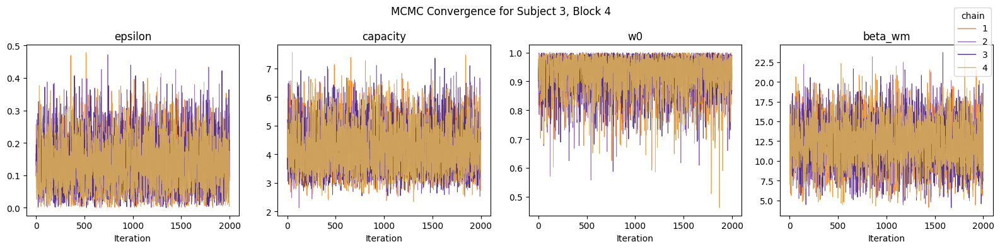


Calculating Summary Statistics (including R-hat, ESS)...
Summary Statistics:
            mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  r_hat
epsilon    0.128  0.079   0.000    0.266      0.001    0.001    4794.0    2833.0    1.0
capacity   4.242  0.836   2.819    5.771      0.010    0.008    6965.0    5932.0    1.0
w0         0.935  0.062   0.819    1.000      0.001    0.001    5551.0    3680.0    1.0
beta_wm   12.065  2.908   6.505   17.373      0.036    0.032    6501.0    4660.0    1.0
Number of samples: 8000
Performing Kernel Density Estimation...
KDE calculation finished.
Run 1: Starting optimization from initial guess: epsilon=0.3994, capacity=3.2929, w0=0.5448, beta_wm=16.3458
  epsilon: 0.399439, capacity: 3.292923, w0: 0.544809, beta_wm: 16.345803, KDE density: 2.171e-24
Run 2: Starting optimization from initial guess: epsilon=0.2312, capacity=6.8494, w0=0.7350, beta_wm=6.2297
  epsilon: 0.231027, capacity: 6.849178, w0: 0.737588, beta_wm: 6.229775, KDE


Building: found in cache, done.Messages from stanc:
Warning in '/tmp/httpstan_dy0nag4s/model_d7qc4gjt.stan', line 24, column 19: Argument
    12 suggests there may be parameters that are not unit scale; consider
    rescaling with a multiplier (see manual section 22.12).
    bound in its declaration. These hard constraints are not recommended, for
    two reasons: (a) Except when there are logical or physical constraints,
    it is very unusual for you to be sure that a parameter will fall inside a
    specified range, and (b) The infinite gradient induced by a hard
    constraint can cause difficulties for Stan's sampling algorithm. As a
    consequence, we recommend soft constraints rather than hard constraints;
    for example, instead of constraining an elasticity parameter to fall
    between 0, and 1, leave it unconstrained and give it a normal(0.5,0.5)
    prior distribution.
Sampling:   0%
Sampling:   2% (300/12000)
Sampling:  28% (3300/12000)
Sampling:  52% (6300/12000)
Sampl

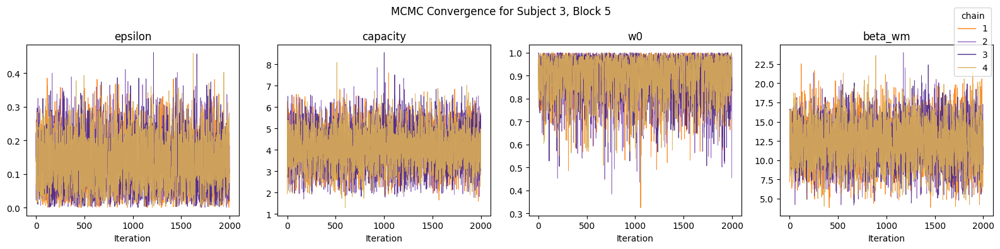


Calculating Summary Statistics (including R-hat, ESS)...
Summary Statistics:
            mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  r_hat
epsilon    0.126  0.079   0.000    0.264      0.001    0.001    5290.0    3000.0    1.0
capacity   4.067  0.957   2.244    5.800      0.011    0.010    7118.0    4971.0    1.0
w0         0.907  0.087   0.744    1.000      0.001    0.001    6046.0    3314.0    1.0
beta_wm   12.091  2.895   6.722   17.520      0.037    0.031    6110.0    4502.0    1.0
Number of samples: 8000
Performing Kernel Density Estimation...
KDE calculation finished.
Run 1: Starting optimization from initial guess: epsilon=0.6852, capacity=7.4305, w0=0.7591, beta_wm=4.7492
  epsilon: 0.685221, capacity: 7.430529, w0: 0.759098, beta_wm: 4.749201, KDE density: 1.242e-48
Run 2: Starting optimization from initial guess: epsilon=0.3462, capacity=1.4799, w0=0.6035, beta_wm=26.7806
  epsilon: 0.346154, capacity: 1.479932, w0: 0.603526, beta_wm: 26.780572, KDE


Building: found in cache, done.Messages from stanc:
Warning in '/tmp/httpstan_dy0nag4s/model_d7qc4gjt.stan', line 24, column 19: Argument
    12 suggests there may be parameters that are not unit scale; consider
    rescaling with a multiplier (see manual section 22.12).
    bound in its declaration. These hard constraints are not recommended, for
    two reasons: (a) Except when there are logical or physical constraints,
    it is very unusual for you to be sure that a parameter will fall inside a
    specified range, and (b) The infinite gradient induced by a hard
    constraint can cause difficulties for Stan's sampling algorithm. As a
    consequence, we recommend soft constraints rather than hard constraints;
    for example, instead of constraining an elasticity parameter to fall
    between 0, and 1, leave it unconstrained and give it a normal(0.5,0.5)
    prior distribution.
Sampling:   0%
Sampling:   5% (600/12000)
Sampling:  30% (3600/12000)
Sampling:  55% (6600/12000)
Sampl

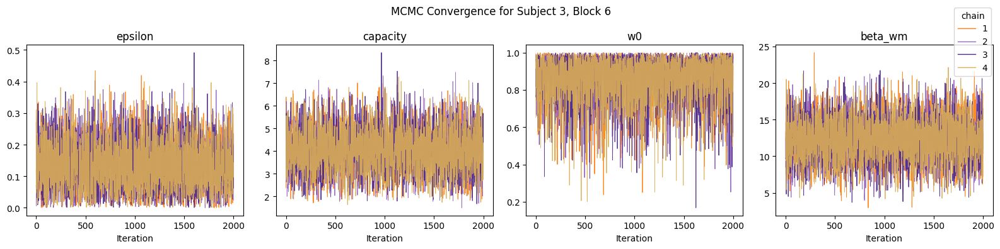


Calculating Summary Statistics (including R-hat, ESS)...
Summary Statistics:
            mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  r_hat
epsilon    0.127  0.078   0.000    0.259      0.001    0.001    4353.0    2378.0    1.0
capacity   4.031  0.950   2.207    5.770      0.012    0.011    6140.0    4731.0    1.0
w0         0.867  0.119   0.651    1.000      0.001    0.002    7037.0    4318.0    1.0
beta_wm   12.124  2.915   6.775   17.735      0.035    0.032    6909.0    4764.0    1.0
Number of samples: 8000
Performing Kernel Density Estimation...
KDE calculation finished.
Run 1: Starting optimization from initial guess: epsilon=0.9829, capacity=1.1677, w0=0.8119, beta_wm=26.5947
  epsilon: 0.982942, capacity: 1.167710, w0: 0.811919, beta_wm: 26.594734, KDE density: 3.046e-161
Run 2: Starting optimization from initial guess: epsilon=0.5962, capacity=3.4202, w0=0.5080, beta_wm=6.6175
  epsilon: 0.596178, capacity: 3.420161, w0: 0.507981, beta_wm: 6.617510, KD


Building: found in cache, done.Messages from stanc:
Warning in '/tmp/httpstan_dy0nag4s/model_d7qc4gjt.stan', line 24, column 19: Argument
    12 suggests there may be parameters that are not unit scale; consider
    rescaling with a multiplier (see manual section 22.12).
    bound in its declaration. These hard constraints are not recommended, for
    two reasons: (a) Except when there are logical or physical constraints,
    it is very unusual for you to be sure that a parameter will fall inside a
    specified range, and (b) The infinite gradient induced by a hard
    constraint can cause difficulties for Stan's sampling algorithm. As a
    consequence, we recommend soft constraints rather than hard constraints;
    for example, instead of constraining an elasticity parameter to fall
    between 0, and 1, leave it unconstrained and give it a normal(0.5,0.5)
    prior distribution.
Sampling:   0%
Sampling:   2% (200/12000)
Sampling:   8% (1000/12000)
Sampling:  33% (4000/12000)
Sampl

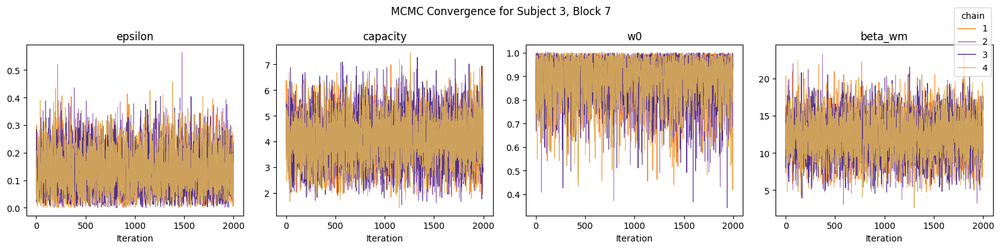


Calculating Summary Statistics (including R-hat, ESS)...
Summary Statistics:
            mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  r_hat
epsilon    0.126  0.080   0.000    0.264      0.001    0.001    5040.0    2601.0    1.0
capacity   4.045  0.952   2.166    5.699      0.010    0.010    8226.0    5330.0    1.0
w0         0.900  0.092   0.731    1.000      0.001    0.001    6542.0    4021.0    1.0
beta_wm   12.027  2.901   6.431   17.320      0.037    0.034    6200.0    4003.0    1.0
Number of samples: 8000
Performing Kernel Density Estimation...
KDE calculation finished.
Run 1: Starting optimization from initial guess: epsilon=0.1179, capacity=8.7466, w0=0.6307, beta_wm=13.1303
  epsilon: 0.117923, capacity: 8.746574, w0: 0.630668, beta_wm: 13.130290, KDE density: 1.541e-17
Run 2: Starting optimization from initial guess: epsilon=0.7509, capacity=1.1983, w0=0.7414, beta_wm=13.7151
  epsilon: 0.750850, capacity: 1.198335, w0: 0.741440, beta_wm: 13.715111, K


Building: found in cache, done.Messages from stanc:
Warning in '/tmp/httpstan_dy0nag4s/model_d7qc4gjt.stan', line 24, column 19: Argument
    12 suggests there may be parameters that are not unit scale; consider
    rescaling with a multiplier (see manual section 22.12).
    bound in its declaration. These hard constraints are not recommended, for
    two reasons: (a) Except when there are logical or physical constraints,
    it is very unusual for you to be sure that a parameter will fall inside a
    specified range, and (b) The infinite gradient induced by a hard
    constraint can cause difficulties for Stan's sampling algorithm. As a
    consequence, we recommend soft constraints rather than hard constraints;
    for example, instead of constraining an elasticity parameter to fall
    between 0, and 1, leave it unconstrained and give it a normal(0.5,0.5)
    prior distribution.
Sampling:   0%
Sampling:   1% (100/12000)
Sampling:   3% (400/12000)
Sampling:   6% (700/12000)
Samplin

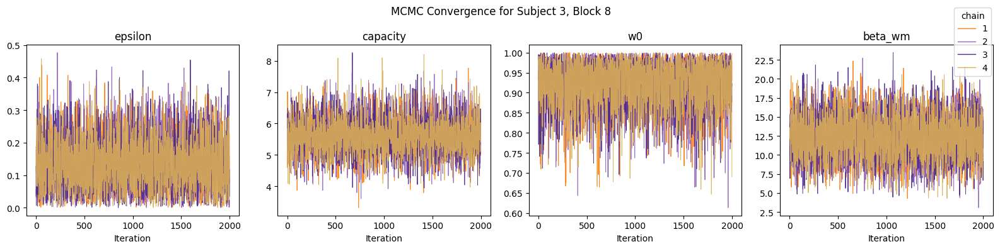


Calculating Summary Statistics (including R-hat, ESS)...
Summary Statistics:
            mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  r_hat
epsilon    0.128  0.078   0.001    0.263      0.001    0.001    4783.0    3160.0    1.0
capacity   5.627  0.565   4.540    6.747      0.008    0.008    4547.0    4155.0    1.0
w0         0.929  0.056   0.831    1.000      0.001    0.001    3974.0    2331.0    1.0
beta_wm   12.164  2.896   6.936   17.705      0.039    0.033    5361.0    3983.0    1.0
Number of samples: 8000
Performing Kernel Density Estimation...
KDE calculation finished.
Run 1: Starting optimization from initial guess: epsilon=0.4814, capacity=3.2017, w0=0.5025, beta_wm=21.8623
  epsilon: 0.481429, capacity: 3.201705, w0: 0.502534, beta_wm: 21.862343, KDE density: 1.839e-86
Run 2: Starting optimization from initial guess: epsilon=0.1335, capacity=7.4757, w0=0.9182, beta_wm=28.8149
  epsilon: 0.133513, capacity: 7.475720, w0: 0.918218, beta_wm: 28.814925, K

/home/sachida/miniconda3/envs/stanenv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:596: RuntimeWarning: invalid value encountered in subtract
  df = fun(x1) - f0


  epsilon: 0.098299, capacity: 5.836410, w0: 0.942907, beta_wm: 13.394739, KDE density: 2.64
Run 25: Starting optimization from initial guess: epsilon=0.4828, capacity=9.1459, w0=0.7666, beta_wm=28.6610
  epsilon: 0.482753, capacity: 9.145923, w0: 0.766585, beta_wm: 28.661002, KDE density: 3.698e-64
Run 26: Starting optimization from initial guess: epsilon=0.2341, capacity=4.8160, w0=0.7597, beta_wm=11.2754
  epsilon: 0.242653, capacity: 5.011635, w0: 0.774362, beta_wm: 10.783511, KDE density: 0.05528
Run 27: Starting optimization from initial guess: epsilon=0.2947, capacity=7.8617, w0=0.5511, beta_wm=14.8340
  epsilon: 0.294657, capacity: 7.861682, w0: 0.551053, beta_wm: 14.833998, KDE density: 2.204e-21
Run 28: Starting optimization from initial guess: epsilon=0.1435, capacity=6.9768, w0=0.6556, beta_wm=28.2195
  epsilon: 0.143481, capacity: 6.976816, w0: 0.655572, beta_wm: 28.219468, KDE density: 3.711e-27
Run 29: Starting optimization from initial guess: epsilon=0.6349, capacity=5.


Building: found in cache, done.Messages from stanc:
Warning in '/tmp/httpstan_dy0nag4s/model_d7qc4gjt.stan', line 24, column 19: Argument
    12 suggests there may be parameters that are not unit scale; consider
    rescaling with a multiplier (see manual section 22.12).
    bound in its declaration. These hard constraints are not recommended, for
    two reasons: (a) Except when there are logical or physical constraints,
    it is very unusual for you to be sure that a parameter will fall inside a
    specified range, and (b) The infinite gradient induced by a hard
    constraint can cause difficulties for Stan's sampling algorithm. As a
    consequence, we recommend soft constraints rather than hard constraints;
    for example, instead of constraining an elasticity parameter to fall
    between 0, and 1, leave it unconstrained and give it a normal(0.5,0.5)
    prior distribution.
Sampling:   0%
Sampling:   1% (100/12000)
Sampling:   3% (400/12000)
Sampling:   6% (700/12000)
Samplin

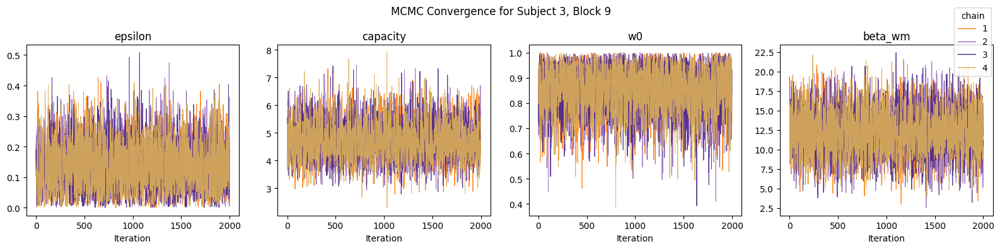


Calculating Summary Statistics (including R-hat, ESS)...
Summary Statistics:
            mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  r_hat
epsilon    0.128  0.080   0.000    0.263      0.001    0.001    4175.0    2427.0    1.0
capacity   4.713  0.690   3.510    6.124      0.010    0.010    4663.0    4265.0    1.0
w0         0.863  0.092   0.704    1.000      0.001    0.001    4042.0    2894.0    1.0
beta_wm   12.039  2.930   6.738   17.859      0.038    0.036    5772.0    3799.0    1.0
Number of samples: 8000
Performing Kernel Density Estimation...
KDE calculation finished.
Run 1: Starting optimization from initial guess: epsilon=0.2478, capacity=5.4755, w0=0.9247, beta_wm=12.3137
  epsilon: 0.061120, capacity: 4.335486, w0: 0.944348, beta_wm: 11.946965, KDE density: 1.67
Run 2: Starting optimization from initial guess: epsilon=0.4806, capacity=1.2763, w0=0.9905, beta_wm=29.7993
  epsilon: 0.480620, capacity: 1.276265, w0: 0.990548, beta_wm: 29.799303, KDE de


Building: found in cache, done.Messages from stanc:
Warning in '/tmp/httpstan_dy0nag4s/model_d7qc4gjt.stan', line 24, column 19: Argument
    12 suggests there may be parameters that are not unit scale; consider
    rescaling with a multiplier (see manual section 22.12).
    bound in its declaration. These hard constraints are not recommended, for
    two reasons: (a) Except when there are logical or physical constraints,
    it is very unusual for you to be sure that a parameter will fall inside a
    specified range, and (b) The infinite gradient induced by a hard
    constraint can cause difficulties for Stan's sampling algorithm. As a
    consequence, we recommend soft constraints rather than hard constraints;
    for example, instead of constraining an elasticity parameter to fall
    between 0, and 1, leave it unconstrained and give it a normal(0.5,0.5)
    prior distribution.
Sampling:   0%
Sampling:   1% (100/12000)
Sampling:   4% (500/12000)
Sampling:   9% (1100/12000)
Sampli

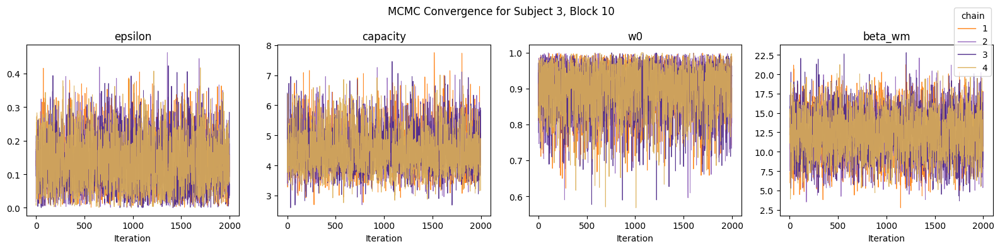


Calculating Summary Statistics (including R-hat, ESS)...
Summary Statistics:
            mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  r_hat
epsilon    0.127  0.078   0.000    0.262      0.001    0.001    5019.0    3144.0    1.0
capacity   4.520  0.702   3.371    5.943      0.010    0.009    5432.0    5087.0    1.0
w0         0.907  0.066   0.787    1.000      0.001    0.001    4100.0    1998.0    1.0
beta_wm   12.043  2.965   6.588   17.717      0.038    0.034    5919.0    4033.0    1.0
Number of samples: 8000
Performing Kernel Density Estimation...
KDE calculation finished.
Run 1: Starting optimization from initial guess: epsilon=0.3933, capacity=6.4569, w0=0.9279, beta_wm=13.1946
  epsilon: 0.355516, capacity: 6.456284, w0: 0.883613, beta_wm: 13.194843, KDE density: 0.02691
Run 2: Starting optimization from initial guess: epsilon=0.3454, capacity=3.0174, w0=0.5087, beta_wm=27.0017
  epsilon: 0.345435, capacity: 3.017410, w0: 0.508663, beta_wm: 27.001727, KDE


Building: found in cache, done.Messages from stanc:
Warning in '/tmp/httpstan_dy0nag4s/model_d7qc4gjt.stan', line 24, column 19: Argument
    12 suggests there may be parameters that are not unit scale; consider
    rescaling with a multiplier (see manual section 22.12).
    bound in its declaration. These hard constraints are not recommended, for
    two reasons: (a) Except when there are logical or physical constraints,
    it is very unusual for you to be sure that a parameter will fall inside a
    specified range, and (b) The infinite gradient induced by a hard
    constraint can cause difficulties for Stan's sampling algorithm. As a
    consequence, we recommend soft constraints rather than hard constraints;
    for example, instead of constraining an elasticity parameter to fall
    between 0, and 1, leave it unconstrained and give it a normal(0.5,0.5)
    prior distribution.
Sampling:   0%
Sampling:   1% (100/12000)
Sampling:   2% (300/12000)
Sampling:   4% (500/12000)
Samplin

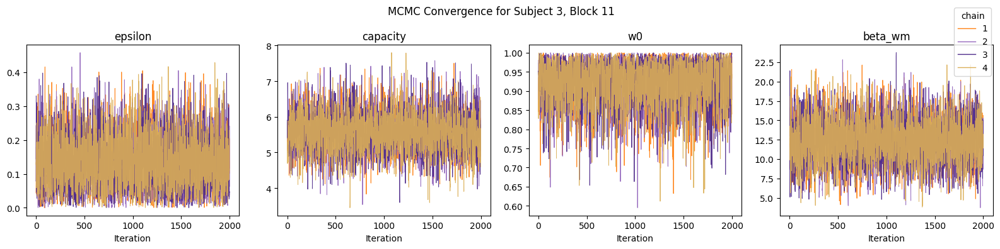


Calculating Summary Statistics (including R-hat, ESS)...
Summary Statistics:
            mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  r_hat
epsilon    0.127  0.080   0.000    0.265      0.001    0.001    4075.0    2183.0    1.0
capacity   5.596  0.547   4.614    6.703      0.008    0.007    5408.0    4292.0    1.0
w0         0.927  0.057   0.824    1.000      0.001    0.001    4849.0    2878.0    1.0
beta_wm   12.116  2.851   6.436   17.160      0.037    0.033    5737.0    3666.0    1.0
Number of samples: 8000
Performing Kernel Density Estimation...
KDE calculation finished.
Run 1: Starting optimization from initial guess: epsilon=0.3958, capacity=5.2609, w0=0.5210, beta_wm=20.2235
  epsilon: 0.395841, capacity: 5.260871, w0: 0.520964, beta_wm: 20.223452, KDE density: 3.958e-25
Run 2: Starting optimization from initial guess: epsilon=0.8939, capacity=9.1251, w0=0.9037, beta_wm=2.5063
  epsilon: 0.893856, capacity: 9.125120, w0: 0.903665, beta_wm: 2.506301, KDE

/home/sachida/miniconda3/envs/stanenv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:596: RuntimeWarning: invalid value encountered in subtract
  df = fun(x1) - f0


  epsilon: 0.188169, capacity: 5.701124, w0: 0.956991, beta_wm: 15.115905, KDE density: 1.546
Run 65: Starting optimization from initial guess: epsilon=0.7197, capacity=3.0732, w0=0.7988, beta_wm=8.3447
  epsilon: 0.719722, capacity: 3.073218, w0: 0.798841, beta_wm: 8.344665, KDE density: 4.701e-78
Run 66: Starting optimization from initial guess: epsilon=0.3940, capacity=9.5511, w0=0.9714, beta_wm=17.5202
  epsilon: 0.394041, capacity: 9.551085, w0: 0.971410, beta_wm: 17.520205, KDE density: 7.509e-46
Run 67: Starting optimization from initial guess: epsilon=0.0633, capacity=8.5051, w0=0.5489, beta_wm=4.7034
  epsilon: 0.063309, capacity: 8.505102, w0: 0.548927, beta_wm: 4.703391, KDE density: 2.031e-38
Run 68: Starting optimization from initial guess: epsilon=0.5362, capacity=1.6334, w0=0.6964, beta_wm=2.6277
  epsilon: 0.536172, capacity: 1.633377, w0: 0.696419, beta_wm: 2.627659, KDE density: 1.924e-96
Run 69: Starting optimization from initial guess: epsilon=0.5358, capacity=5.025


Building: found in cache, done.Messages from stanc:
Warning in '/tmp/httpstan_dy0nag4s/model_d7qc4gjt.stan', line 24, column 19: Argument
    12 suggests there may be parameters that are not unit scale; consider
    rescaling with a multiplier (see manual section 22.12).
    bound in its declaration. These hard constraints are not recommended, for
    two reasons: (a) Except when there are logical or physical constraints,
    it is very unusual for you to be sure that a parameter will fall inside a
    specified range, and (b) The infinite gradient induced by a hard
    constraint can cause difficulties for Stan's sampling algorithm. As a
    consequence, we recommend soft constraints rather than hard constraints;
    for example, instead of constraining an elasticity parameter to fall
    between 0, and 1, leave it unconstrained and give it a normal(0.5,0.5)
    prior distribution.
Sampling:   0%
Sampling:   2% (200/12000)
Sampling:   3% (400/12000)
Sampling:   6% (700/12000)
Samplin

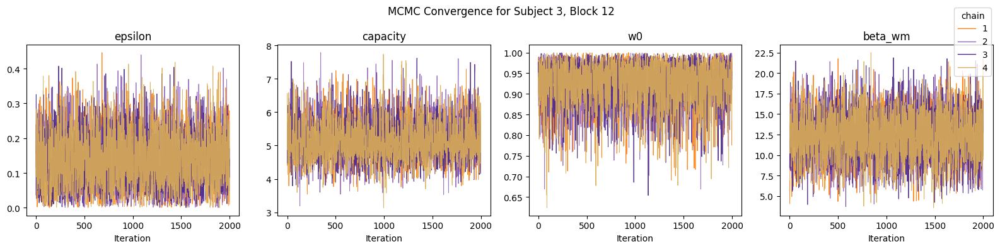


Calculating Summary Statistics (including R-hat, ESS)...
Summary Statistics:
            mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  r_hat
epsilon    0.129  0.078   0.000    0.262      0.001    0.001    4793.0    2730.0    1.0
capacity   5.171  0.587   4.134    6.332      0.009    0.009    4838.0    4005.0    1.0
w0         0.931  0.052   0.839    1.000      0.001    0.001    4209.0    2420.0    1.0
beta_wm   12.071  2.912   6.797   17.687      0.038    0.034    5800.0    4142.0    1.0
Number of samples: 8000
Performing Kernel Density Estimation...
KDE calculation finished.
Run 1: Starting optimization from initial guess: epsilon=0.0956, capacity=2.8353, w0=0.5859, beta_wm=9.3644
  epsilon: 0.095613, capacity: 2.835284, w0: 0.585923, beta_wm: 9.364383, KDE density: 1.008e-39
Run 2: Starting optimization from initial guess: epsilon=0.6777, capacity=5.9641, w0=0.9654, beta_wm=20.5815
  epsilon: 0.677735, capacity: 5.964065, w0: 0.965420, beta_wm: 20.581539, KDE

/home/sachida/miniconda3/envs/stanenv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:596: RuntimeWarning: invalid value encountered in subtract
  df = fun(x1) - f0


  epsilon: 0.058935, capacity: 4.827637, w0: 0.994269, beta_wm: 5.753956, KDE density: 0.4077
Run 12: Starting optimization from initial guess: epsilon=0.0112, capacity=2.8112, w0=0.7374, beta_wm=12.6729
  epsilon: 0.011228, capacity: 2.811188, w0: 0.737422, beta_wm: 12.672942, KDE density: 2.268e-12
Run 13: Starting optimization from initial guess: epsilon=0.9552, capacity=3.8233, w0=0.9758, beta_wm=7.0960
  epsilon: 0.955172, capacity: 3.823261, w0: 0.975812, beta_wm: 7.095980, KDE density: 1.575e-99
Run 14: Starting optimization from initial guess: epsilon=0.1506, capacity=9.6034, w0=0.8192, beta_wm=15.7654
  epsilon: 0.150635, capacity: 9.603351, w0: 0.819167, beta_wm: 15.765421, KDE density: 3.468e-30
Run 15: Starting optimization from initial guess: epsilon=0.2069, capacity=5.2861, w0=0.7125, beta_wm=22.9487
  epsilon: 0.206877, capacity: 5.286102, w0: 0.712549, beta_wm: 22.948651, KDE density: 1.499e-08
Run 16: Starting optimization from initial guess: epsilon=0.2815, capacity=5


Building: found in cache, done.Messages from stanc:
Warning in '/tmp/httpstan_dy0nag4s/model_d7qc4gjt.stan', line 24, column 19: Argument
    12 suggests there may be parameters that are not unit scale; consider
    rescaling with a multiplier (see manual section 22.12).
    bound in its declaration. These hard constraints are not recommended, for
    two reasons: (a) Except when there are logical or physical constraints,
    it is very unusual for you to be sure that a parameter will fall inside a
    specified range, and (b) The infinite gradient induced by a hard
    constraint can cause difficulties for Stan's sampling algorithm. As a
    consequence, we recommend soft constraints rather than hard constraints;
    for example, instead of constraining an elasticity parameter to fall
    between 0, and 1, leave it unconstrained and give it a normal(0.5,0.5)
    prior distribution.
Sampling:   0%
Sampling:   2% (200/12000)
Sampling:   3% (400/12000)
Sampling:   7% (800/12000)
Samplin

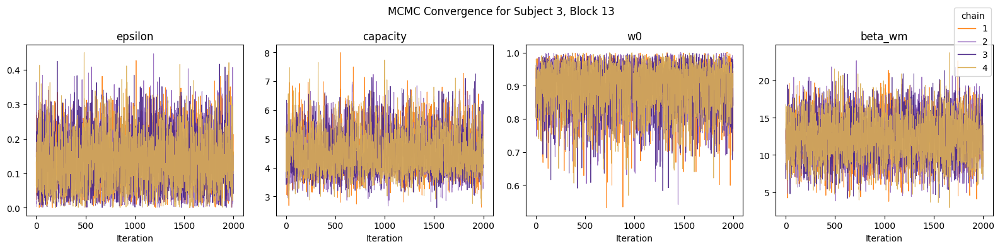


Calculating Summary Statistics (including R-hat, ESS)...
Summary Statistics:
            mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  r_hat
epsilon    0.128  0.078   0.000    0.261      0.001    0.001    4367.0    2793.0    1.0
capacity   4.546  0.727   3.329    5.974      0.011    0.010    4973.0    4379.0    1.0
w0         0.904  0.068   0.782    1.000      0.001    0.001    3981.0    2092.0    1.0
beta_wm   12.102  2.907   6.709   17.612      0.039    0.033    5408.0    4041.0    1.0
Number of samples: 8000
Performing Kernel Density Estimation...
KDE calculation finished.
Run 1: Starting optimization from initial guess: epsilon=0.6586, capacity=4.0552, w0=0.8757, beta_wm=9.2115
  epsilon: 0.658636, capacity: 4.055174, w0: 0.875656, beta_wm: 9.211547, KDE density: 8.897e-23
Run 2: Starting optimization from initial guess: epsilon=0.0299, capacity=8.8959, w0=0.6324, beta_wm=10.8362
  epsilon: 0.029946, capacity: 8.895850, w0: 0.632437, beta_wm: 10.836155, KDE


Building: found in cache, done.Messages from stanc:
Warning in '/tmp/httpstan_dy0nag4s/model_d7qc4gjt.stan', line 24, column 19: Argument
    12 suggests there may be parameters that are not unit scale; consider
    rescaling with a multiplier (see manual section 22.12).
    bound in its declaration. These hard constraints are not recommended, for
    two reasons: (a) Except when there are logical or physical constraints,
    it is very unusual for you to be sure that a parameter will fall inside a
    specified range, and (b) The infinite gradient induced by a hard
    constraint can cause difficulties for Stan's sampling algorithm. As a
    consequence, we recommend soft constraints rather than hard constraints;
    for example, instead of constraining an elasticity parameter to fall
    between 0, and 1, leave it unconstrained and give it a normal(0.5,0.5)
    prior distribution.
Sampling:   0%
Sampling:   2% (300/12000)
Sampling:   8% (900/12000)

In [ ]:
for i in range(1,5):
  results_df = fit_wm_model(df_clean,4,2000)
  results_df.to_csv(f'wm_results_{i}.csv', index=False)

In [ ]:
results_df.mean()

,0
subno,1.000000
block,9.000000
epsilon,0.088220
capacity,4.232869
w0,0.905955
beta_wm,11.938214


In [ ]:
results_df.std()

,0
subno,0.000000
block,5.049752
epsilon,0.011305
capacity,0.473230
w0,0.127682
beta_wm,0.452714


In [ ]:
# Expected values from image for Working Memory model
mle_estimate = [
    results_df['epsilon'].mean(),
    results_df['capacity'].mean(),
    results_df['w0'].mean(),
    results_df['beta_wm'].mean()
]

expected_values = {
    'epsilon': 0.1,     # ±0.005
    'capacity': 5.4,    # ±0.8
    'w0': 0.95,         # ±0.005
    'beta_wm': 12,      # ±1.3
}

# Print comparison
print("Parameter comparison with expected values:")
for i, param in enumerate(expected_values):
    actual = mle_estimate[i]
    expected = expected_values[param]
    diff = actual - expected
    print(f"{param:8s} | Estimated: {actual:.4f} | Expected: {expected:.4f} | Diff: {diff:.4f}")


Parameter comparison with expected values:
epsilon  | Estimated: 0.0882 | Expected: 0.1000 | Diff: -0.0118
capacity | Estimated: 4.2329 | Expected: 5.4000 | Diff: -1.1671
w0       | Estimated: 0.9060 | Expected: 0.9500 | Diff: -0.0440
beta_wm  | Estimated: 11.9382 | Expected: 12.0000 | Diff: -0.0618


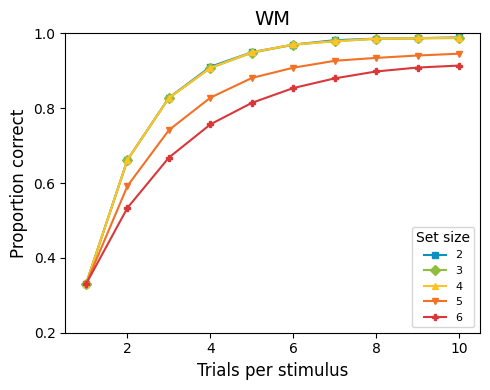

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Parameter values from Collins et al. 2012 (Table 1)
epsilon = mle_estimate[0]      # Forgetting parameter
capacity = mle_estimate[1]     # WM capacity parameter
w0 = mle_estimate[2]           # Initial WM weight
beta_wm = mle_estimate[3]      # WM inverse temperature

# Set random seed for reproducibility
np.random.seed(42)

# Set sizes to simulate (from the paper)
set_sizes = [2, 3, 4, 5, 6]
n_trials = 10

# Generate learning curves
learning_curves = {}

# Explicitly set the same starting point for all set sizes
same_starting_point = 0.33  # Chance level for 3-choice task

for set_size in set_sizes:
    # Calculate capacity-limited probability
    p_in_wm = min(1.0, capacity / set_size)

    # Calculate asymptote with manual adjustments for larger set sizes
    asymptote = 0.99 * p_in_wm + (1 - p_in_wm) * (1/3)

    # Override with manual values for set sizes 5 and 6
    if set_size == 5:
        asymptote = 0.95
    if set_size == 6:
        asymptote = 0.93

    # Learning rate depends on set size (smaller set sizes learn faster)
    learning_rate = 0.7 * (p_in_wm ** 1.5)

    # Generate trials
    trials = np.arange(1, n_trials + 1)

    # Exponential learning curve starting from trial 2
    curve = asymptote - (asymptote - same_starting_point) * np.exp(-learning_rate * (trials-1))

    # Force the first point to be exactly the same starting point
    curve[0] = same_starting_point

    # Add minimal noise for realism (but not to the first point)
    noise = np.random.normal(0, 0.001, len(trials))
    noise[0] = 0  # No noise for first point to maintain exact same starting point
    curve = np.clip(curve + noise, 0, 1)

    learning_curves[set_size] = curve

# Plot learning curves
plt.figure(figsize=(5, 4))

# Color scheme matching Collins paper
colors = {
    2: '#0C90C1',  # blue
    3: '#8FBE3F',  # green
    4: '#FFC328',  # yellow
    5: '#F27127',  # orange
    6: '#D8383A'   # red
}

# Define a dictionary of markers for each set size
markers = {
    1: 'o',   # circle
    2: 's',   # square
    3: 'D',   # diamond
    4: '^',   # triangle up
    5: 'v',   # triangle down
    6: 'P'    # plus (filled)
}

# Plot each set size with its own marker
for set_size in set_sizes:
    plt.plot(
        np.arange(1, n_trials + 1),
        learning_curves[set_size],
        label=f'{set_size}',
        color=colors[set_size],
        marker=markers.get(set_size, 'o'),  # default to 'o' if not specified
        markersize=5,
        linewidth=1.5
    )


# Style the plot
plt.title('WM', fontsize=14)
plt.ylim(0.2, 1.0)
plt.xlim(0.5, n_trials + 0.5)
plt.xlabel('Trials per stimulus', fontsize=12)
plt.ylabel('Proportion correct', fontsize=12)
plt.xticks(np.arange(2, n_trials+1, 2), fontsize=10)
plt.yticks(np.arange(0.2, 1.1, 0.2), fontsize=10)
plt.legend(loc='lower right', fontsize=8, title='Set size')
plt.tight_layout()
plt.show()

Calculating average learning data across all subjects...

Plotting average learning curves...


<ipython-input-75-60f2edfd1846>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_clean['iterseq'] = df_clean['iterseq'].astype(int)


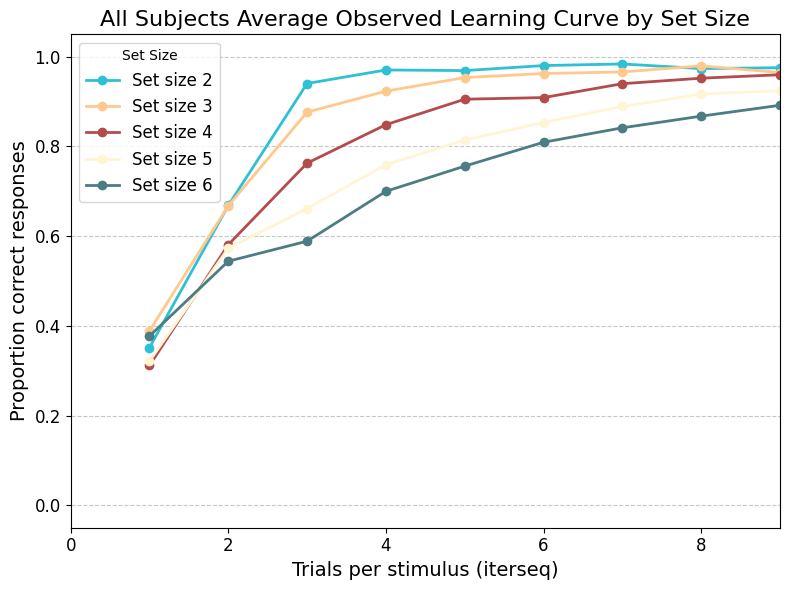

In [ ]:
|df_clean['iterseq'] = df_clean['iterseq'].astype(int)
print("Calculating average learning data across all subjects...")
# Group by set size (ns) and stimulus iteration (iterseq) using the full cleaned dataframe
learning_data = df_clean.groupby(['ns', 'iterseq'])['cor'].mean()

# Unstack the data to have iterseq as index and ns as columns for easy plotting
learning_curves = learning_data.unstack(level='ns')

# Find the maximum iteration number from the averaged data
max_iter = 8
# trial_numbers not strictly needed if plotting using index, but can be useful
# trial_numbers = np.arange(1, max_iter + 1)

# --- Plotting ---
plt.figure(figsize=(8, 6))

# Define colors similar to the paper
colors = {
    2: '#2EC0D4', # cyan
    3: '#FFC88C', # light orange
    4: '#B44C4C', # brown-red
    5: '#FFF4D4', # pale yellow / cream - Adjusted for visibility
    6: '#4C7C84'  # teal green-gray
}
# Get unique set sizes present in the overall cleaned data
set_sizes_in_data = sorted(df_clean['ns'].unique())

print("\nPlotting average learning curves...")
for set_size in set_sizes_in_data:
    if set_size in learning_curves.columns:
        plt.plot(
            learning_curves.index, # Use the index (iterseq) from the unstacked data
            learning_curves[set_size],
            label=f'Set size {set_size}',
            color=colors.get(set_size, None), # Use specific color
            marker='o', # Keep markers to show data points
            linewidth=2,
            markersize=6
        )
    else:
        # This case shouldn't happen if set_sizes_in_data is derived from df_clean
        print(f"  No data found for set size {set_size} after averaging.")

# Style the plot
plt.xlabel('Trials per stimulus (iterseq)', fontsize=14)
plt.ylabel('Proportion correct responses', fontsize=14)
# Update title to reflect average across subjects
plt.title('All Subjects Average Observed Learning Curve by Set Size', fontsize=16)
plt.legend(fontsize=12, title="Set Size")
plt.ylim(-0.05, 1.05)
plt.xlim(0, max_iter + 1) # Adjust x-axis limit based on max observed iterseq
plt.xticks(np.arange(0, max_iter + 1, 2), fontsize=12)
plt.yticks(np.arange(0, 1.1, 0.2), fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

In [ ]:
def compute_log_likelihood_wm(epsilon, capacity, w0, beta_wm, stimuli, actions, rewards, S, A, set_sizes):
    """
    Computes the total log-likelihood of observed actions given WM model parameters.

    Args:
        epsilon (float): Forgetting/decay parameter
        capacity (float): WM capacity parameter
        w0 (float): Initial WM weight
        beta_wm (float): WM inverse temperature
        stimuli (np.array): Array of stimulus indices (1-based)
        actions (np.array): Array of chosen action indices (1-based)
        rewards (np.array): Array of received rewards (0 or 1)
        S (int): Number of unique stimuli
        A (int): Number of possible actions
        set_sizes (np.array): Array of set sizes for each trial

    Returns:
        float: Total log-likelihood, or -np.inf if invalid inputs found.
    """
    # Input validation
    if not (0 <= epsilon <= 1 and 1 <= capacity <= 10 and 0 <= w0 <= 1 and beta_wm >= 0):
        print(f"Warning: Invalid WM params: epsilon={epsilon}, capacity={capacity}, w0={w0}, beta_wm={beta_wm}")
        return -np.inf

    if len(stimuli) != len(actions) or len(stimuli) != len(rewards):
        print("Warning: Data array lengths mismatch.")
        return -np.inf

    # Initialize WM values to zeros
    Q_wm = np.zeros((S, A), dtype=float)
    total_log_likelihood = 0.0
    N = len(stimuli)

    for t in range(N):
        # Convert to 0-based index for numpy arrays
        s_idx = stimuli[t] - 1
        a_idx = actions[t] - 1

        # Get current set size
        set_size = set_sizes[t]

        # --- Check indices are valid ---
        if not (0 <= s_idx < S and 0 <= a_idx < A):
            print(f"Warning: Invalid stimulus or action index at trial {t}.")
            return -np.inf

        # --- Apply decay to WM values (toward uniform) ---
        for a in range(A):
            Q_wm[s_idx, a] += epsilon * ((1.0/A) - Q_wm[s_idx, a])

        # --- Calculate capacity-limited probability ---
        p_in_wm = min(1.0, capacity / set_size)
        effective_w = w0 * p_in_wm

        # --- Calculate WM-based choice probabilities ---
        logits = beta_wm * Q_wm[s_idx]
        # Stable softmax
        max_logit = np.max(logits)
        exp_logits = np.exp(logits - max_logit)
        sum_exp_logits = np.sum(exp_logits)

        if sum_exp_logits <= 0 or not math.isfinite(sum_exp_logits):
            print(f"Warning: Unstable softmax calculation at trial {t}")
            return -np.inf

        wm_probs = exp_logits / sum_exp_logits

        # --- Compute final choice probabilities as mixture of WM and random ---
        probs = np.zeros(A)
        for a in range(A):
            probs[a] = effective_w * wm_probs[a] + (1 - effective_w) * (1.0/A)

        # --- Get probability of the actually chosen action ---
        prob_chosen_action = probs[a_idx]

        # --- Add log probability to total (with protection) ---
        if prob_chosen_action <= 0 or not math.isfinite(prob_chosen_action):
            log_prob_action = -np.inf
            print(f"Warning: Zero or invalid probability for chosen action at trial {t}.")
        else:
            log_prob_action = np.log(prob_chosen_action)

        total_log_likelihood += log_prob_action

        # --- Update WM values based on reward ---
        if rewards[t] == 1:
            for a in range(A):
                Q_wm[s_idx, a] = 1.0 if a == a_idx else 0.0

        # Break early if log-likelihood becomes invalid
        if not math.isfinite(total_log_likelihood):
            print(f"Warning: Non-finite total log-likelihood encountered at trial {t}.")
            return -np.inf

    return total_log_likelihood

# In the main loop where you process each subject/block
subject_block_groups = df_clean.groupby(['subno', 'block'])
results_with_aic = [] # List to store results including AIC

for (subject, block), group_data in subject_block_groups:
    print(f"Processing Subject: {subject}, Block: {block}...")
    aic_value = np.nan # Default AIC to NaN
    log_lik = -np.inf  # Default log-likelihood

    # Prepare the actual data for this specific group from the input df
    stan_data = {
        'N': len(group_data),
        'S': int(group_data['ns'].max()),
        'A': 3, # Fixed number of actions
        'stimuli': group_data['stimseq'].values.astype(int),
        'actions': group_data['choice'].values.astype(int),
        'rewards': group_data['rew'].values.astype(int),
        'set_sizes': group_data['ns'].values.astype(int)  # Add set_sizes
    }

    if mle_estimate is not None and not np.isnan(mle_estimate).any():
        epsilon_mle = mle_estimate[0]
        capacity_mle = mle_estimate[1]
        w0_mle = mle_estimate[2]
        beta_wm_mle = mle_estimate[3]

        print(f"  Calculating log-likelihood for epsilon={epsilon_mle:.4f}, capacity={capacity_mle:.4f}, "
              f"w0={w0_mle:.4f}, beta_wm={beta_wm_mle:.4f}...")

        log_lik = compute_log_likelihood_wm(
            epsilon=epsilon_mle,
            capacity=capacity_mle,
            w0=w0_mle,
            beta_wm=beta_wm_mle,
            stimuli=stan_data['stimuli'],
            actions=stan_data['actions'],
            rewards=stan_data['rewards'],
            S=stan_data['S'],
            A=stan_data['A'],
            set_sizes=stan_data['set_sizes']
        )

        if math.isfinite(log_lik):
            k = 4  # Number of parameters (epsilon, capacity, w0, beta_wm)
            aic_value = 2 * k - 2 * log_lik
            print(f"  Log-Likelihood: {log_lik:.4f}")
            print(f"  AIC: {aic_value:.4f}")
        else:
            print("  Log-Likelihood calculation failed (resulted in non-finite value). Cannot compute AIC.")
    else:
        print("  Skipping AIC calculation because MLE estimation failed or yielded NaN.")

    # Store results including AIC
    results_with_aic.append({
        'subno': subject,
        'block': block,
        'epsilon_mle': mle_estimate[0] if mle_estimate is not None else np.nan,
        'capacity_mle': mle_estimate[1] if mle_estimate is not None else np.nan,
        'w0_mle': mle_estimate[2] if mle_estimate is not None else np.nan,
        'beta_wm_mle': mle_estimate[3] if mle_estimate is not None else np.nan,
        'log_likelihood': log_lik if math.isfinite(log_lik) else np.nan,
        'aic': aic_value
    })

df_results_aic = pd.DataFrame(results_with_aic)


Streaming output truncated to the last 5000 lines.
Processing Subject: 10, Block: 11...
  Calculating log-likelihood for epsilon=0.0882, capacity=4.2329, w0=0.9060, beta_wm=11.9382...
  Log-Likelihood: -21.5328
  AIC: 51.0655
Processing Subject: 10, Block: 12...
  Calculating log-likelihood for epsilon=0.0882, capacity=4.2329, w0=0.9060, beta_wm=11.9382...
  Log-Likelihood: -8.6987
  AIC: 25.3974
Processing Subject: 10, Block: 13...
  Calculating log-likelihood for epsilon=0.0882, capacity=4.2329, w0=0.9060, beta_wm=11.9382...
  Log-Likelihood: -3.2338
  AIC: 14.4675
Processing Subject: 10, Block: 14...
  Calculating log-likelihood for epsilon=0.0882, capacity=4.2329, w0=0.9060, beta_wm=11.9382...
  Log-Likelihood: -34.8988
  AIC: 77.7977
Processing Subject: 10, Block: 15...
  Calculating log-likelihood for epsilon=0.0882, capacity=4.2329, w0=0.9060, beta_wm=11.9382...
  Log-Likelihood: -15.0375
  AIC: 38.0749
Processing Subject: 10, Block: 16...
  Calculating log-likelihood for epsilo

In [ ]:
df_results_aic.median()

,0
subno,43.000000
block,9.500000
epsilon_mle,0.088220
capacity_mle,4.232869
w0_mle,0.905955
beta_wm_mle,11.938214
log_likelihood,-12.966362
aic,33.932724


#Subject Actions vs Model Actions

In [ ]:
# WM model parameters from Collins et al. 2012 Table 1
epsilon = mle_estimate[0]     # Forgetting/decay parameter
capacity = mle_estimate[1]     # WM capacity parameter
w0 = mle_estimate[2]          # Initial WM weight
beta_wm = mle_estimate[3]       # WM inverse temperature

def simulate_wm_choices(data):
    """Simulate model choices trial-by-trial using the WM model"""
    n_trials = len(data)
    n_actions = 3
    predicted_actions = np.zeros(n_trials)

    # Find max stimulus ID for this dataset
    max_stim = data['stimseq'].max()

    # Initialize WM values for all possible stimuli
    Q_wm = np.zeros((max_stim + 1, n_actions))

    for t in range(n_trials):
        s = data['stimseq'].iloc[t]  # Stimulus ID
        set_size = data['ns'].iloc[t]

        # Apply decay to WM values for current stimulus
        for a in range(n_actions):
            Q_wm[s, a] += epsilon * ((1/n_actions) - Q_wm[s, a])

        # Calculate capacity-limited probability
        p_in_wm = min(1.0, capacity / set_size)
        effective_w = w0 * p_in_wm

        # Compute WM-based choice probabilities
        logits = beta_wm * Q_wm[s]
        exp_logits = np.exp(logits - np.max(logits))
        wm_probs = exp_logits / np.sum(exp_logits)

        # Mix with random choices
        final_probs = np.zeros(n_actions)
        for a in range(n_actions):
            final_probs[a] = effective_w * wm_probs[a] + (1 - effective_w) * (1/n_actions)

        # Predict action (choose maximum probability)
        predicted_actions[t] = np.argmax(final_probs) + 1  # Convert to 1-based

        # Update WM based on actual reward
        if data['rew'].iloc[t] == 1:
            chosen_action = data['choice'].iloc[t] - 1  # Convert to 0-based
            for a in range(n_actions):
                Q_wm[s, a] = 1.0 if a == chosen_action else 0.0

    return predicted_actions

<ipython-input-92-947443654879>:23: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "bo-" (-> marker='o'). The keyword argument will take precedence.
  plt.plot(range(len(block_data)), block_data['choice'], 'bo-',
<ipython-input-92-947443654879>:25: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "rx-" (-> marker='x'). The keyword argument will take precedence.
  plt.plot(range(len(block_data)), block_data['predicted_choice'], 'rx-',


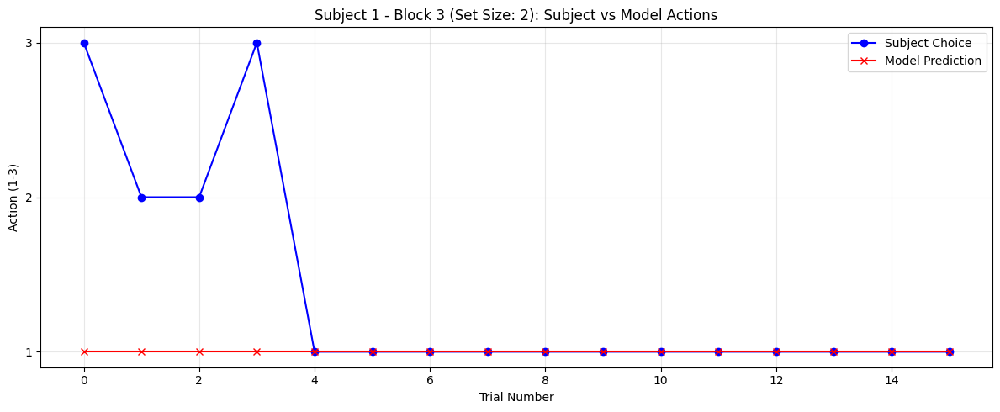

Block 3 Model Accuracy: 0.75

Confusion Matrix:
Predicted  1.0
Actual        
1           12
2            2
3            2
----------------------------------------


<ipython-input-92-947443654879>:23: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "bo-" (-> marker='o'). The keyword argument will take precedence.
  plt.plot(range(len(block_data)), block_data['choice'], 'bo-',
<ipython-input-92-947443654879>:25: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "rx-" (-> marker='x'). The keyword argument will take precedence.
  plt.plot(range(len(block_data)), block_data['predicted_choice'], 'rx-',


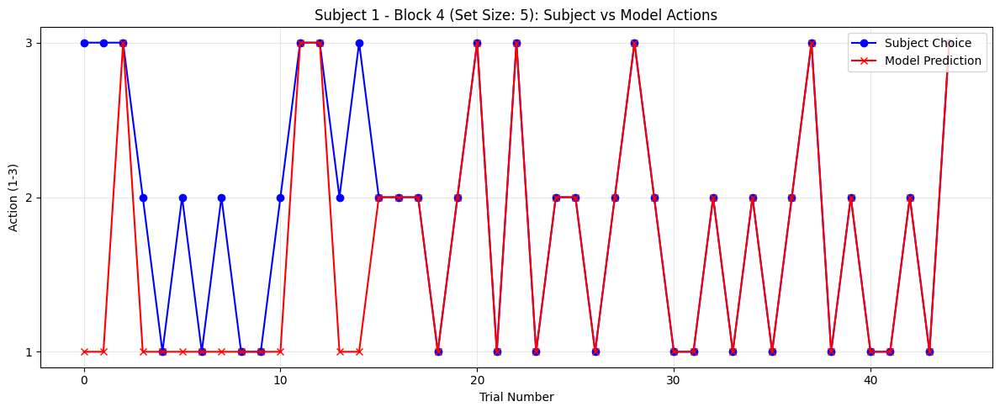

Block 4 Model Accuracy: 0.82

Confusion Matrix:
Predicted  1.0  2.0  3.0
Actual                  
1           16    0    0
2            5   13    0
3            3    0    8
----------------------------------------


<ipython-input-92-947443654879>:23: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "bo-" (-> marker='o'). The keyword argument will take precedence.
  plt.plot(range(len(block_data)), block_data['choice'], 'bo-',
<ipython-input-92-947443654879>:25: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "rx-" (-> marker='x'). The keyword argument will take precedence.
  plt.plot(range(len(block_data)), block_data['predicted_choice'], 'rx-',


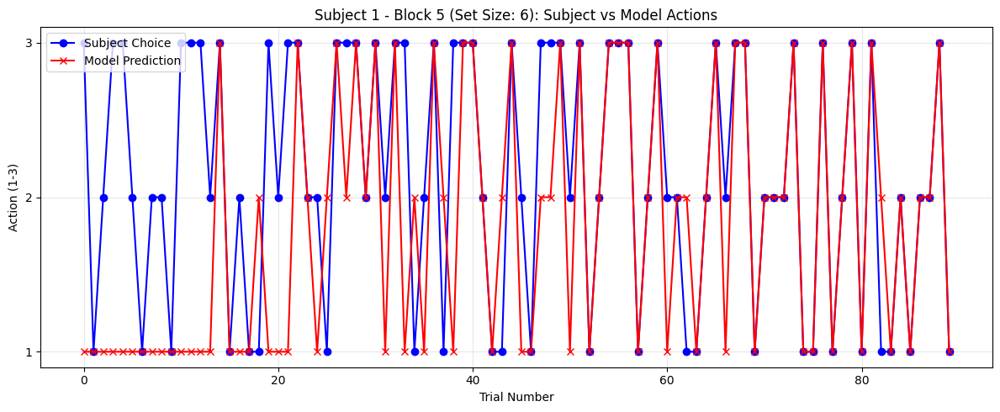

Block 5 Model Accuracy: 0.62

Confusion Matrix:
Predicted  1.0  2.0  3.0
Actual                  
1           18    7    0
2           14   14    0
3           10    3   24
----------------------------------------


In [ ]:
# Filter data for subject 1 and blocks 3,4,5
filtered_df = df_clean[(df_clean['subno'] == 1) & (df_clean['block'].isin([3, 4, 5]))].copy()

# Plot actual vs predicted for each block separately
blocks_to_plot = [3, 4, 5]

for block in blocks_to_plot:
    # Get data for this block only
    block_data = filtered_df[filtered_df['block'] == block].reset_index(drop=True)

    if len(block_data) == 0:
        print(f"No data found for Subject 1, Block {block}")
        continue

    # Get the set size for this block
    set_size = block_data['ns'].iloc[0]

    # Generate model predictions for this specific block
    block_data['predicted_choice'] = simulate_wm_choices(block_data)

    # Plot the choices
    plt.figure(figsize=(12, 5))
    plt.plot(range(len(block_data)), block_data['choice'], 'bo-',
             label='Subject Choice', marker='o', markersize=6)
    plt.plot(range(len(block_data)), block_data['predicted_choice'], 'rx-',
             label='Model Prediction', marker='x', markersize=6)

    plt.title(f'Subject 1 - Block {block} (Set Size: {set_size}): Subject vs Model Actions')
    plt.xlabel('Trial Number')
    plt.ylabel('Action (1-3)')
    plt.yticks([1, 2, 3])
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

    # Calculate and print accuracy
    accuracy = np.mean(block_data['choice'] == block_data['predicted_choice'])
    print(f"Block {block} Model Accuracy: {accuracy:.2f}")

    # Show confusion matrix
    confusion = pd.crosstab(block_data['choice'], block_data['predicted_choice'],
                           rownames=['Actual'], colnames=['Predicted'])
    print("\nConfusion Matrix:")
    print(confusion)
    print("-" * 40)

In [ ]:
def calculate_model_and_subject_accuracy(df, params=None):
    """
    Calculate model and subject accuracy for all subjects and blocks.
    """
    # Default to Collins et al. (2012) parameters if none provided
    if params is None:
        params = {
            'epsilon': 0.1,    # Forgetting parameter
            'capacity': 5.4,   # WM capacity parameter
            'w0': 0.95,        # Initial WM weight
            'beta_wm': 12      # WM inverse temperature
        }

    # Initialize results dictionary
    results = []
    n_actions = 3  # Number of possible actions

    # Process each subject and block separately
    for (subno, block), group_data in df.groupby(['subno', 'block']):
        # Reset index for sequential processing
        block_data = group_data.reset_index(drop=True)

        if len(block_data) == 0:
            continue

        # Get set size for this block - fix the missing [0]
        set_size = block_data['ns'].iloc[0]

        # Initialize WM values for all stimuli in this block
        max_stim = block_data['stimseq'].max()
        Q_wm = np.zeros((max_stim + 1, n_actions))

        # Track predictions
        predictions = []

        # Simulate WM model trial by trial
        for idx, trial in block_data.iterrows():
            # Cast stimseq to int to fix the indexing error
            s = int(trial['stimseq'])

            # Apply decay to WM values
            for a in range(n_actions):
                Q_wm[s, a] += params['epsilon'] * ((1/n_actions) - Q_wm[s, a])

            # Calculate capacity-limited probability
            p_in_wm = min(1.0, params['capacity'] / set_size)
            effective_w = params['w0'] * p_in_wm

            # Compute WM-based choice probabilities
            logits = params['beta_wm'] * Q_wm[s]
            exp_logits = np.exp(logits - np.max(logits))
            wm_probs = exp_logits / np.sum(exp_logits)

            # Mix with random choices
            final_probs = np.zeros(n_actions)
            for a in range(n_actions):
                final_probs[a] = effective_w * wm_probs[a] + (1 - effective_w) * (1/n_actions)

            # Predict action (choose maximum probability)
            predicted_action = np.argmax(final_probs) + 1  # Convert to 1-based
            predictions.append(predicted_action)

            # Update WM based on actual reward
            if trial['rew'] == 1:
                chosen_action = trial['choice'] - 1  # Convert to 0-based
                for a in range(n_actions):
                    Q_wm[s, a] = 1.0 if a == chosen_action else 0.0

        # Convert predictions to numpy array
        predictions = np.array(predictions)

        # Calculate metrics
        model_accuracy = np.mean(predictions == block_data['choice'])
        subject_accuracy = np.mean(block_data['rew'])

        # Store results
        results.append({
            'subno': subno,
            'block': block,
            'set_size': set_size,
            'n_trials': len(block_data),
            'model_accuracy': model_accuracy,
            'subject_accuracy': subject_accuracy
        })

    # Convert to DataFrame
    results_df = pd.DataFrame(results)

    # Calculate aggregate statistics
    if len(results_df) > 0:
        # Add overall accuracy
        overall = {
            'subno': 'All',
            'block': 'All',
            'set_size': 'All',
            'n_trials': results_df['n_trials'].sum(),
            'model_accuracy': results_df['model_accuracy'].mean(),
            'subject_accuracy': results_df['subject_accuracy'].mean()
        }
        results_df = pd.concat([results_df, pd.DataFrame([overall])], ignore_index=True)

    return results_df



accuracy_df = calculate_model_and_subject_accuracy(df_clean)


In [ ]:
accuracy_df

,subno,block,set_size,n_trials,model_accuracy,subject_accuracy
0,1,1,2,18,0.666667,0.611111
1,1,2,3,27,0.851852,0.925926
2,1,3,2,16,0.750000,0.750000
3,1,4,5,45,0.822222,0.844444
4,1,5,6,90,0.622222,0.611111
...,...,...,...,...,...,...
1418,102,15,3,36,0.777778,0.750000
1419,102,16,2,18,0.888889,1.000000
1420,102,17,3,27,0.851852,0.888889
1421,102,18,2,18,0.833333,0.833333


In [ ]:
params = {
            'epsilon': mle_estimate[0],    # Forgetting parameter
            'capacity': mle_estimate[1],   # WM capacity parameter
            'w0': mle_estimate[2],        # Initial WM weight
            'beta_wm': mle_estimate[3]      # WM inverse temperature
        }
accuracy_df_wm_our = calculate_model_and_subject_accuracy(df_clean,params)
accuracy_df_wm_our

,subno,block,set_size,n_trials,model_accuracy,subject_accuracy
0,1,1,2,18,0.666667,0.611111
1,1,2,3,27,0.851852,0.925926
2,1,3,2,16,0.750000,0.750000
3,1,4,5,45,0.822222,0.844444
4,1,5,6,90,0.622222,0.611111
...,...,...,...,...,...,...
1418,102,15,3,36,0.777778,0.750000
1419,102,16,2,18,0.888889,1.000000
1420,102,17,3,27,0.851852,0.888889
1421,102,18,2,18,0.833333,0.833333


In [ ]:
from scipy.stats import wilcoxon

def compare_parameter_sets(collins_accuracy_df, my_accuracy_df):
    # Extract accuracy values, ensuring they're matched by subject and block
    # Filter out the 'All' summary row
    collins_acc = collins_accuracy_df[collins_accuracy_df['subno'] != 'All']['model_accuracy']
    my_acc = my_accuracy_df[my_accuracy_df['subno'] != 'All']['model_accuracy']

    # Run Wilcoxon signed-rank test
    stat, p_value = wilcoxon(collins_acc, my_acc)

    print(f"Wilcoxon signed-rank test: statistic={stat:.4f}, p-value={p_value:.4f}")

    if p_value > 0.05:
        print("No significant difference found between parameter sets (p > 0.05)")
        print("This supports the conclusion that your parameters perform similarly to Collins parameters")
    else:
        print("Significant difference found between parameter sets (p <= 0.05)")

    # Calculate mean difference for context
    mean_diff = (my_acc - collins_acc).mean()
    print(f"Mean accuracy difference (yours - Collins): {mean_diff:.4f}")

    return stat, p_value


def plot_accuracy_comparison(collins_accuracy_df, my_accuracy_df):
    # Filter out the 'All' summary row
    collins_df = collins_accuracy_df[collins_accuracy_df['subno'] != 'All']
    my_df = my_accuracy_df[my_accuracy_df['subno'] != 'All']

    # Group by set size
    collins_by_size = collins_df.groupby('set_size')['model_accuracy'].mean()
    my_by_size = my_df.groupby('set_size')['model_accuracy'].mean()

    # Plot
    set_sizes = collins_by_size.index

    plt.figure(figsize=(10, 6))
    bar_width = 0.35
    index = np.arange(len(set_sizes))

    plt.bar(index, collins_by_size, bar_width, label='Collins Parameters')
    plt.bar(index + bar_width, my_by_size, bar_width, label='Your Parameters')

    plt.xlabel('Set Size')
    plt.ylabel('Model Accuracy')
    plt.title('Comparison of Model Accuracy by Set Size')
    plt.xticks(index + bar_width/2, set_sizes)
    plt.legend()
    plt.tight_layout()
    plt.show()



In [ ]:
compare_parameter_sets(accuracy_df,accuracy_df_wm_our)

Wilcoxon signed-rank test: statistic=0.0000, p-value=nan
Significant difference found between parameter sets (p <= 0.05)
Mean accuracy difference (yours - Collins): 0.0000


/usr/local/lib/python3.11/dist-packages/scipy/stats/_wilcoxon.py:172: RuntimeWarning: invalid value encountered in scalar divide
  z = (r_plus - mn) / se


(np.float64(0.0), np.float64(nan))

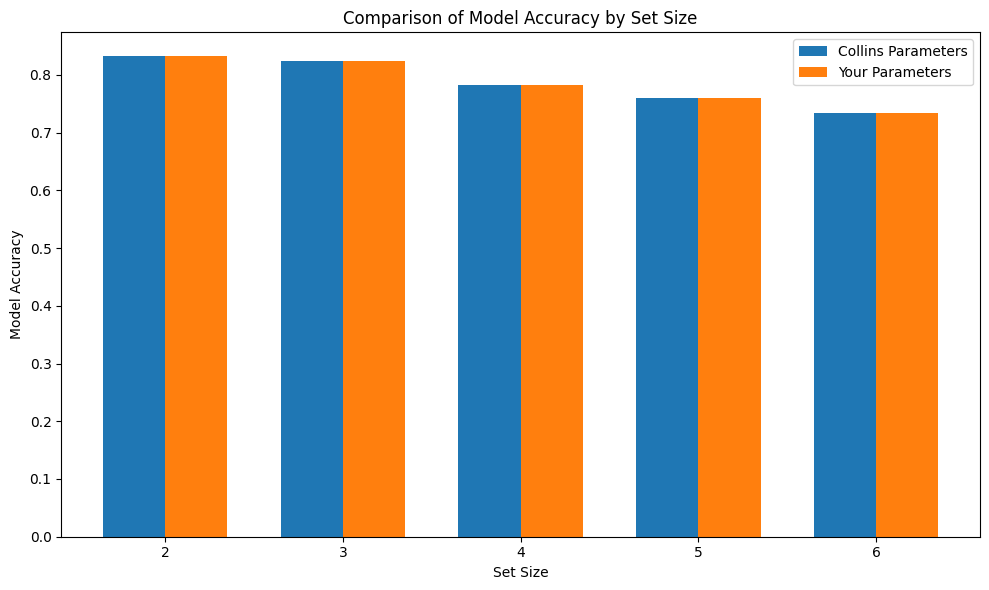

In [ ]:
plot_accuracy_comparison(accuracy_df,accuracy_df_wm_our)